In [1]:
#step5: combine and run through seurat pipeline
#default normalization 
#library
suppressMessages(library(Seurat))
suppressMessages(library(ggplot2))

In [2]:
#12. combine all the rds into one seurat subject 

setwd("/g/data/zk16/qing/tuomas/shNupr1_scRNA/04QC/")

filename <- list.files(pattern="*qc.rds")
filename

[1] "IGO_028758_noempty_nodoublet_qc.rds" "IGO_028759_noempty_nodoublet_qc.rds"
[3] "IGO_028760_noempty_nodoublet_qc.rds"

In [3]:
#read in rds file for each batch
filelist=list()

for (i in 1:length(filename)){

        filelist[[i]]<-readRDS(filename[[i]])
}


In [4]:
#only keep genes expressed in each batch
for (i in 1:length(filename)){

        #filter genes

        count=GetAssayData(object = filelist[[i]], slot = 'count')

        keep = rowSums(count > 0) > 0

        filelist[[i]]=filelist[[i]][keep,]

        print(filelist[[i]])

}

An object of class Seurat 
28782 features across 5910 samples within 1 assay 
Active assay: RNA (28782 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap
An object of class Seurat 
28465 features across 3171 samples within 1 assay 
Active assay: RNA (28465 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap
An object of class Seurat 
29882 features across 8834 samples within 1 assay 
Active assay: RNA (29882 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap


In [5]:
#merge data
obj <- merge(filelist[[1]], y = c(filelist[[2]], filelist[[3]]), add.cell.ids = c("IGO_028758", "IGO_028759", "IGO_028760"), project = "shNupr1_scRNA", merge.data = TRUE)



In [9]:
obj

An object of class Seurat 
33198 features across 17915 samples within 1 assay 
Active assay: RNA (33198 features, 0 variable features)

In [8]:
#check meta data

head(obj[[]])

,orig.ident,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,hash,Submission.date,Mouse.ID,Hashtag.ID,Hashtag.sequence,...,Cells.for.submission,X10x.submission.ID,X10x.sequencing.data.ID,Hashtag.sequencing.data.ID,Hashtag,percent.mt,percent.ribo,RNA_snn_res.0.5,seurat_clusters,condition
,<chr>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
IGO_028758_AAACCCAAGGTGAGAA-1,SeuratProject,4851,2073,569,8,B0308-TotalSeqB,NA,BD1210,HTO-8,TATAGAACGCCAGGC,...,NA,IGO-028758,NA,NA,B0308,2.741703,0.08122037,1,1,shNupr1
IGO_028758_AAACCCAAGGTGGTTG-1,SeuratProject,3843,2032,1808,7,B0307-TotalSeqB,NA,BD1229,HTO-7,GAGTCTGCCAGTATC,...,NA,IGO-028758,NA,NA,B0307,1.535259,0.04059329,0,0,control
IGO_028758_AAACCCACAGTAGAGC-1,SeuratProject,6245,2636,1464,7,B0307-TotalSeqB,NA,BD1229,HTO-7,GAGTCTGCCAGTATC,...,NA,IGO-028758,NA,NA,B0307,3.122498,0.03618895,4,4,control
IGO_028758_AAACCCACAGTGTGCC-1,SeuratProject,6658,2102,672,8,B0303-TotalSeqB,NA,AM1598,HTO-3,CTTGCCGCATGTCAT,...,NA,IGO-028758,NA,NA,B0303,2.282968,0.05812556,1,1,control
IGO_028758_AAACCCAGTAACCAGG-1,SeuratProject,5579,2162,1111,6,B0306-TotalSeqB,NA,BD1226,HTO-6,TATGCTGCCACGGTA,...,NA,IGO-028758,NA,NA,B0306,2.132999,0.09786700,1,1,shNupr1
IGO_028758_AAACCCAGTGTTGAGG-1,SeuratProject,4815,2139,1556,8,B0302-TotalSeqB,NA,AL1825,HTO-2,GGTCGAGAGCATTCA,...,Viability: 84%,IGO-028758,NA,NA,B0302,1.578401,0.04776739,3,3,shNupr1


In [10]:
colnames(obj[[]])

[1] "orig.ident"                 "nCount_RNA"                
 [3] "nFeature_RNA"               "nCount_HTO"                
 [5] "nFeature_HTO"               "hash"                      
 [7] "Submission.date"            "Mouse.ID"                  
 [9] "Hashtag.ID"                 "Hashtag.sequence"          
[11] "shRNA.group"                "Age"                       
[13] "Sex"                        "GFP..Epithelial.cells"     
[15] "GFP..other.cells"           "NA."                       
[17] "Cells.for.submission"       "X10x.submission.ID"        
[19] "X10x.sequencing.data.ID"    "Hashtag.sequencing.data.ID"
[21] "Hashtag"                    "percent.mt"                
[23] "percent.ribo"               "RNA_snn_res.0.5"           
[25] "seurat_clusters"            "condition"

In [6]:
table(obj$shRNA.group, obj$X10x.submission.ID)

           
            IGO-028758 IGO-028759 IGO-028760
  shNupr1_1       2204       1515       1560
  shNupr1_3       1986       1137       3621
  shRen           1720        519       3653

In [7]:
obj$condition=ifelse(obj$shRNA.group %in% c('shNupr1_1', 'shNupr1_3'), 'shNupr1', 'control')
table(obj$condition)


control shNupr1 
   5892   12023 

In [11]:
#remove outlier samples due to tumor
#IDname=unique(obj$ID)

#IDname=IDname[! IDname %in% c('1105','1106','1107')]

#obj=subset(obj,  ID %in% IDname)


obj$both=paste(obj$Age, obj$condition, sep="_")
table(obj$both)


A_control A_shNupr1 Y_control Y_shNupr1 
     4254      6415      1638      5608 

In [6]:
#basic filter
#build new seurat object to Include features detected in at least this many cells. Include cells where at least this many features are detected.
#obj=CreateSeuratObject(counts = GetAssayData(obj, slot='count'), project = 'scRNA_exercise', min.cells = 3, min.features = 200, meta.data = obj[[]]) 
#obj


An object of class Seurat 
27966 features across 37522 samples within 1 assay 
Active assay: RNA (27966 features, 0 variable features)

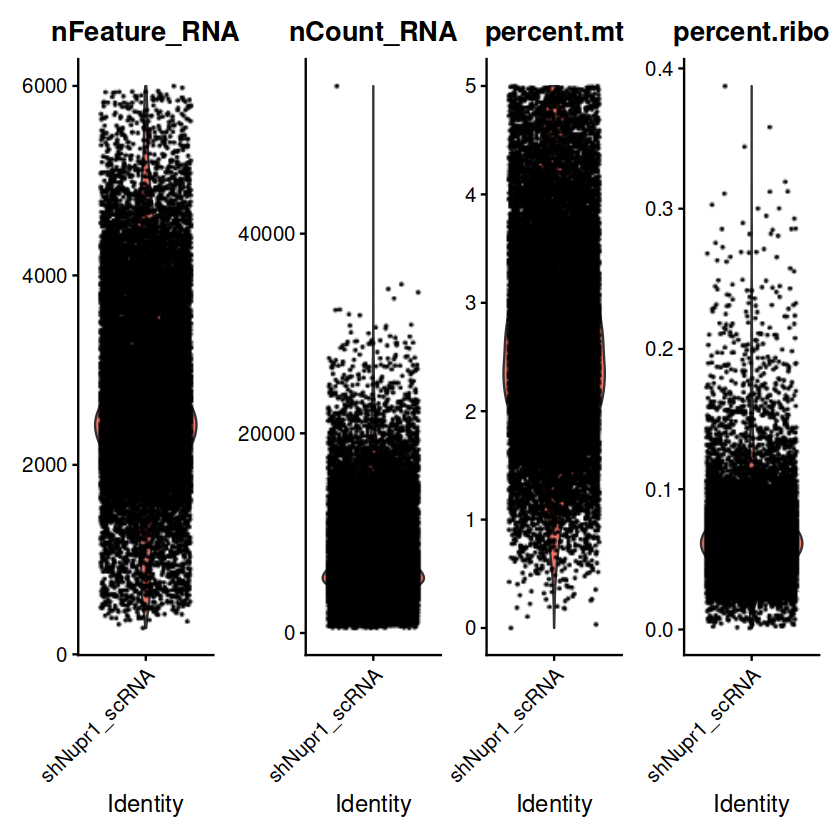

In [12]:
#Standard pre-processing workflow
#QC and selecting cells for further analysis
Idents(obj)='shNupr1_scRNA'

VlnPlot(obj, features = c("nFeature_RNA", "nCount_RNA", "percent.mt", "percent.ribo"), ncol = 4)


In [15]:
#options(repr.plot.width=12, repr.plot.height=12)
#plot1 <- FeatureScatter(obj, feature1 = "nCount_RNA", feature2 = "percent.mt")
#plot2 <- FeatureScatter(obj, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
#plot1 + plot2

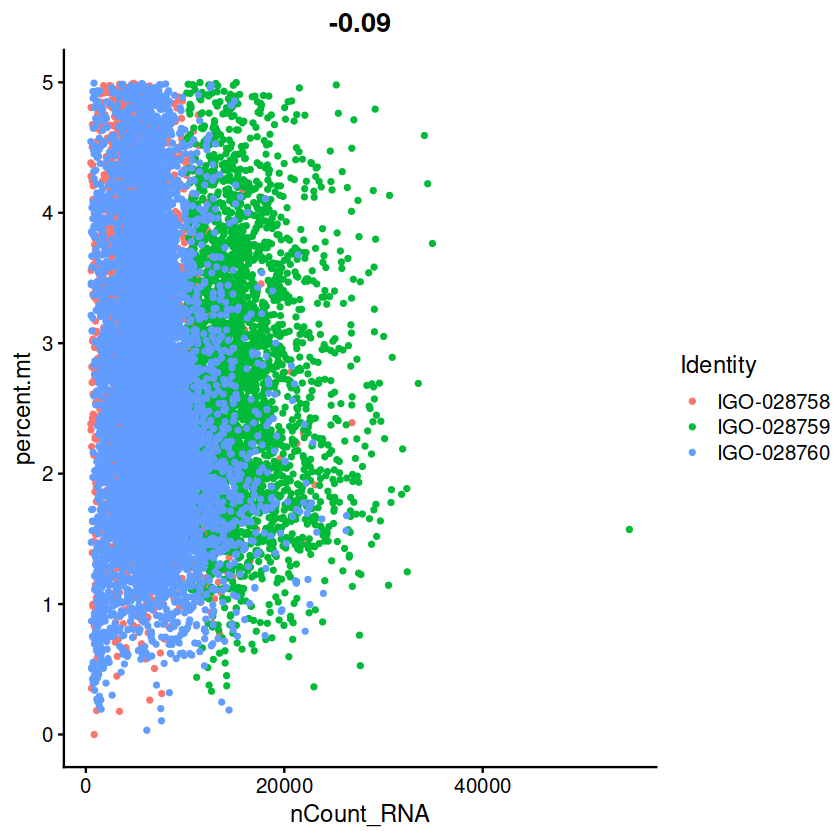

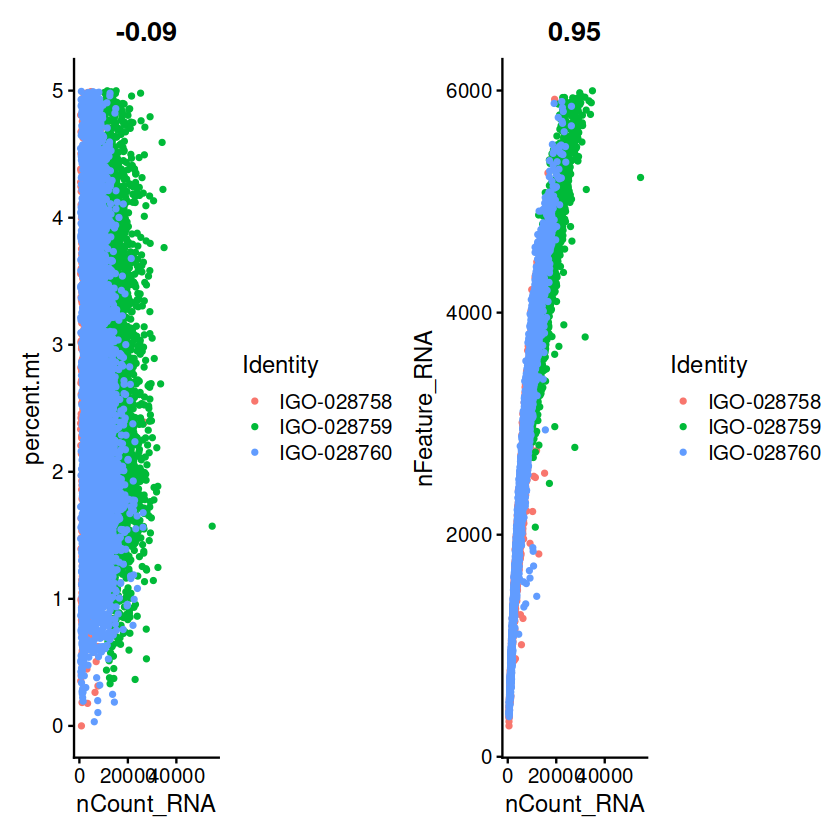

In [13]:
FeatureScatter(obj, feature1 = "nCount_RNA", feature2 = "percent.mt", group.by ='X10x.submission.ID')

plot1 <- FeatureScatter(obj, feature1 = "nCount_RNA", feature2 = "percent.mt", group.by ='X10x.submission.ID')
plot2 <- FeatureScatter(obj, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by ='X10x.submission.ID')
plot1 + plot2

In [14]:
#normalize data
obj <- NormalizeData(obj, normalization.method = "LogNormalize", scale.factor = 10000)

When using repel, set xnudge and ynudge to 0 for optimal results



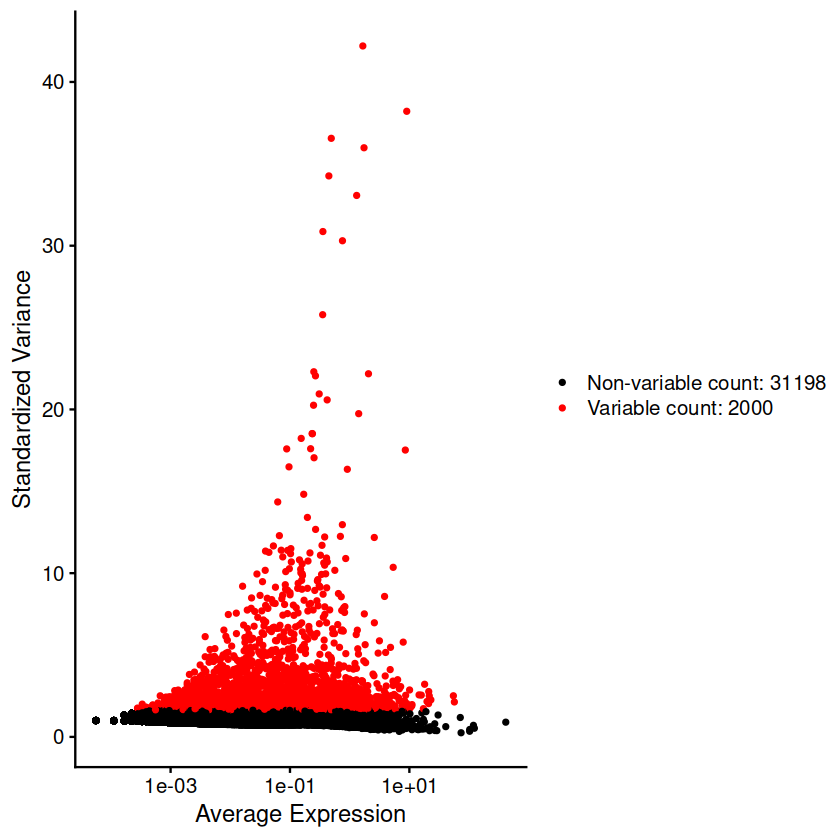

In [15]:
#dimension reduction (seurat pipeline)

#1.Identification of highly variable features (feature selection)
obj <- FindVariableFeatures(obj, selection.method = "vst", nfeatures = 2000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(obj), 10)

# plot variable features with and without labels
plot1 <- VariableFeaturePlot(obj)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
plot1 

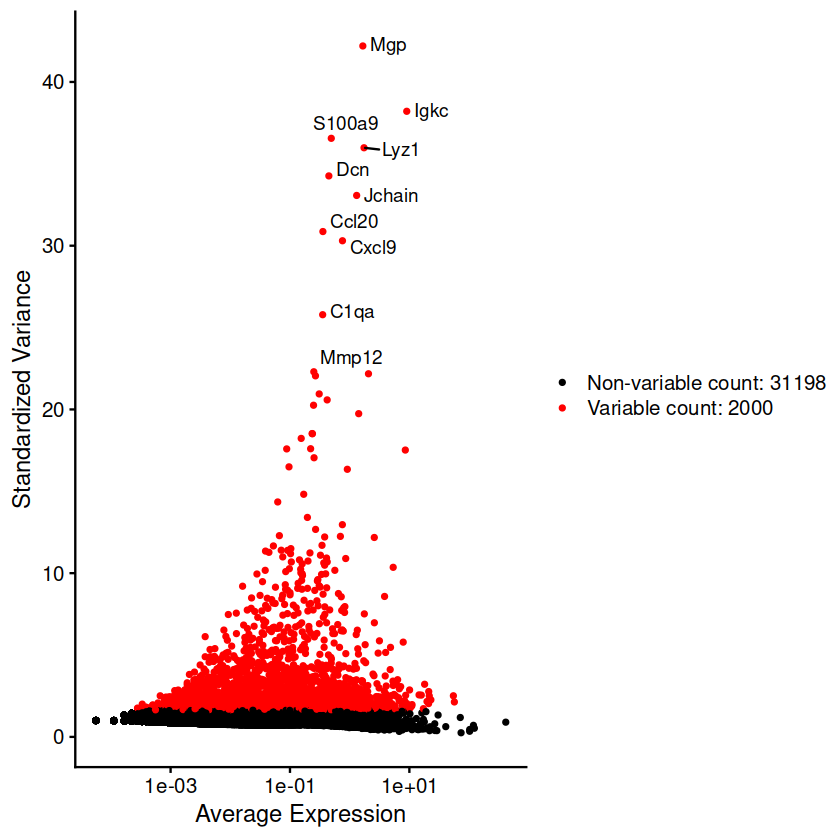

In [16]:
plot2

In [17]:
#2Scaling the data
all.genes <- rownames(obj)
obj <- ScaleData(obj, features = all.genes)

Centering and scaling data matrix



In [18]:
#3 run PCA
obj <- RunPCA(obj, features = VariableFeatures(object = obj))

PC_ 1 
Positive:  Nckap5, Ank3, Mecom, Lamp3, Sftpb, Wfdc2, Slc34a2, Sftpd, Sftpa1, Atp1b1 
	   Cxcl15, Chil1, Hc, Lpcat1, Sfta2, Ppp1r14c, Cbr2, Ptprf, Cldn18, Scd1 
	   Napsa, Pard3, Sdc4, Fasn, Car8, S100g, Phldb2, Errfi1, Itga9, Tmem243 
Negative:  Psap, Ctss, Cybb, Vim, Clec7a, Ccl6, Zeb2, Mpeg1, Mrc1, Chil3 
	   Plek, Atp6v0d2, Ctsd, Plet1, Tyrobp, Lpl, Mertk, Tnfaip2, Olr1, Gpcpd1 
	   Lgals3, Fxyd5, Ear2, Mctp1, Trps1, Dab2, Dennd4a, Lipa, Lrp12, Gda 
PC_ 2 
Positive:  Fabp5, Alcam, Napsa, Slc34a2, Sftpb, Chil1, Hc, Cbr2, Lamp3, Sfta2 
	   Ank3, Cxcl15, Ppp1r14c, Sftpd, S100g, Wfdc2, Scd1, Sftpa1, Fasn, Abca3 
	   Tmem164, Atp1b1, Gclc, Chchd10, Egfl6, Lgi3, Ptprf, Gm43085, Car8, Muc1 
Negative:  Rhoj, Scn7a, Akap12, Ramp2, Prex2, Ifitm3, Tm4sf1, Slc43a3, Tspan7, Ptprb 
	   Cldn5, Cyyr1, Tmem100, Cavin2, Aqp1, Fmo1, Cdh5, Cxcl12, Ldb2, Eng 
	   Ctla2a, Hmcn1, Hpgd, Gng11, Sema3c, Adgrl4, Heg1, Foxf1, S1pr1, Pde3a 
PC_ 3 
Positive:  Serping1, Col1a2, Mgp, Col3a1, Ogn, Lama2, Col

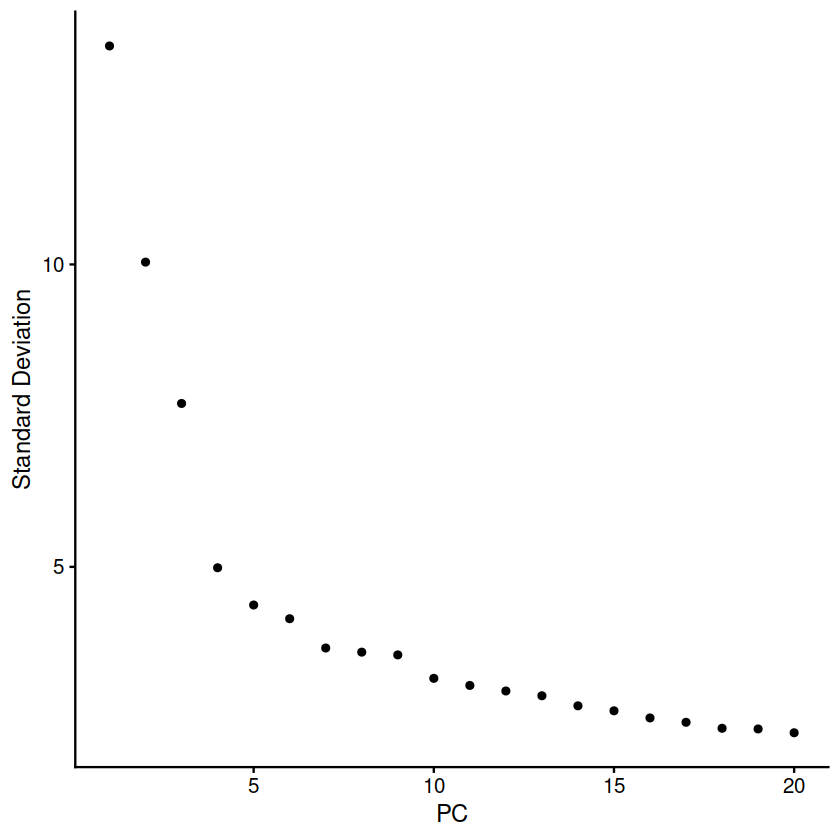

In [19]:
#4 decide how many dims to use
ElbowPlot(obj)


In [20]:
#5. cluster cells
obj <- FindNeighbors(obj, dims = 1:10)
obj <- FindClusters(obj, resolution = 0.5)


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 17915
Number of edges: 571656

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9035
Number of communities: 13
Elapsed time: 2 seconds


In [21]:
#6. Run non-linear dimensional reduction (UMAP/tSNE)
obj <- RunUMAP(obj, dims = 1:10, verbose = F)


Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


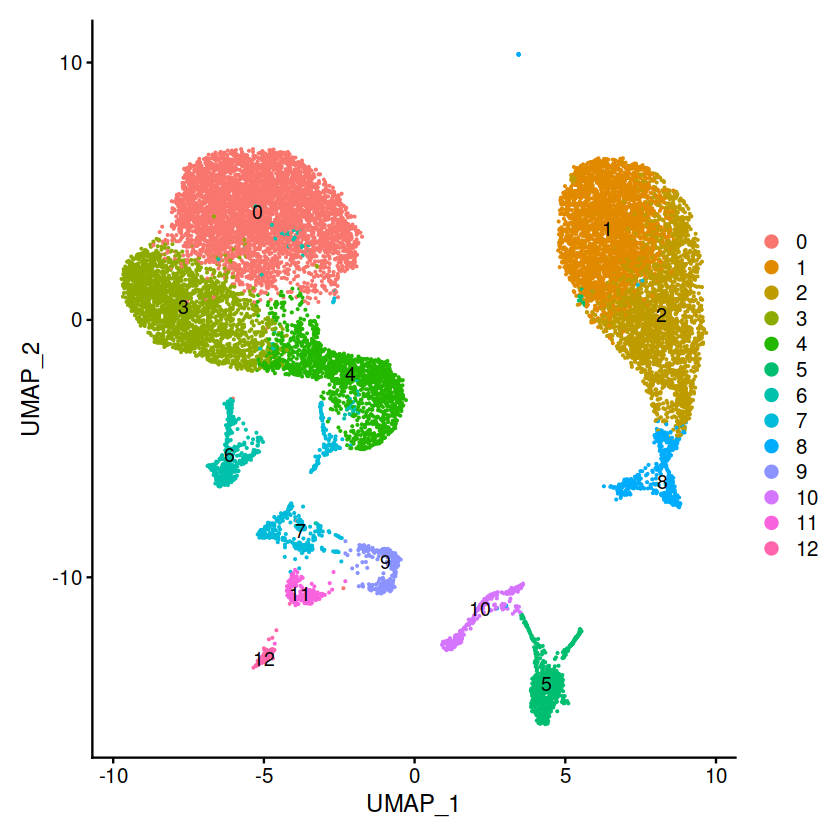

In [22]:
p1=DimPlot(obj, reduction = "umap", label = T)
p1


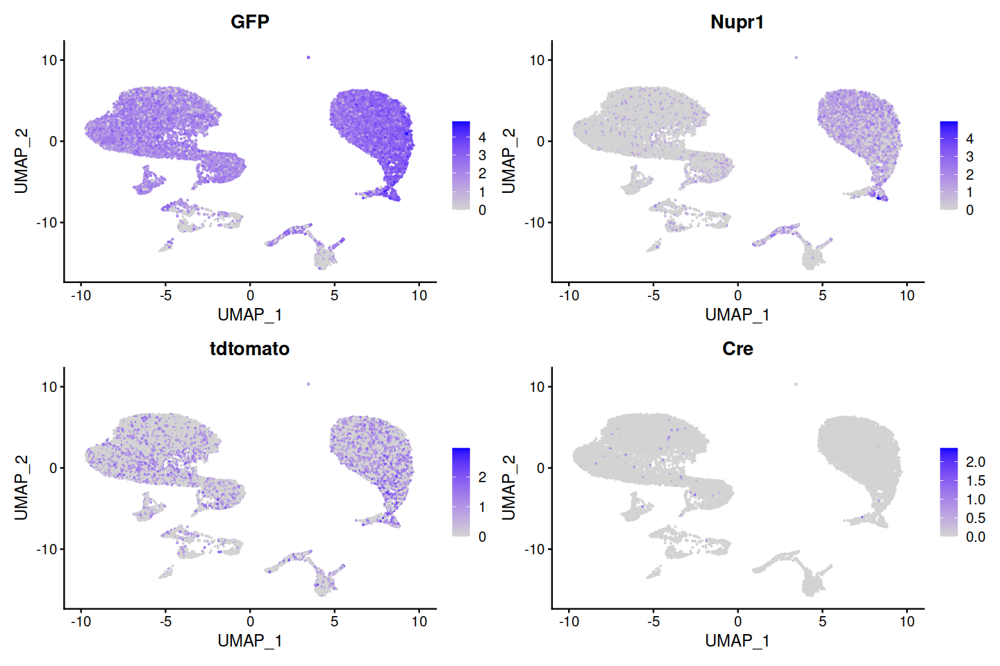

In [23]:
#sanity check on GFP
options(repr.plot.width=12, repr.plot.height=8)
FeaturePlot(obj, reduction = "umap", features =c('GFP','Nupr1', 'tdtomato', 'Cre'))

In [45]:
head(rownames(obj
             ))

[1] "Xkr4"    "Gm19938" "Gm37381" "Rp1"     "Sox17"   "Gm37587"

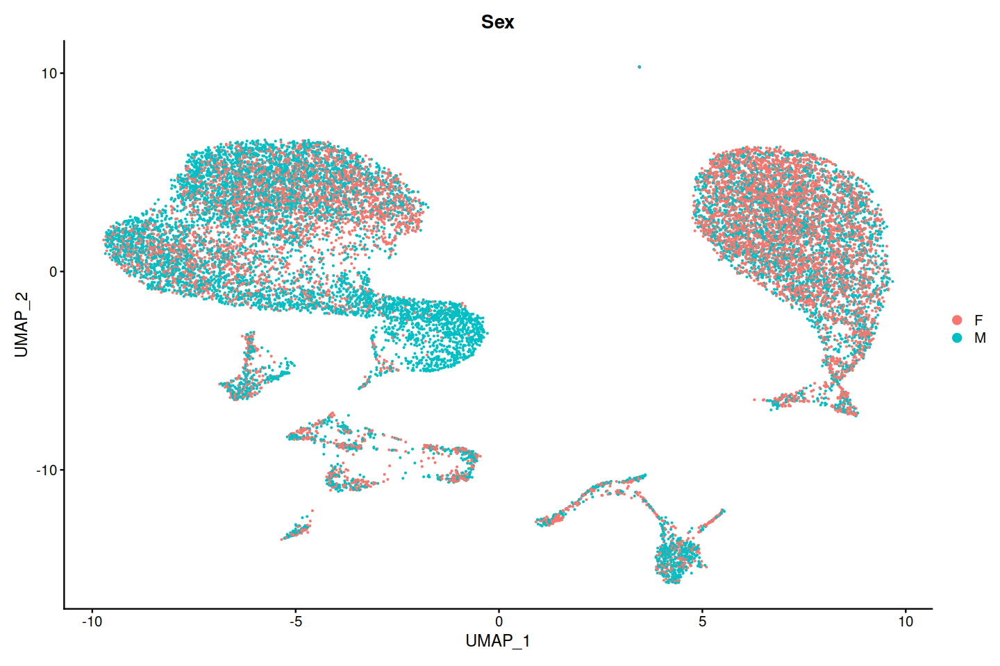

In [24]:
p2=DimPlot(obj, reduction = "umap", group.by = 'Sex')
p2

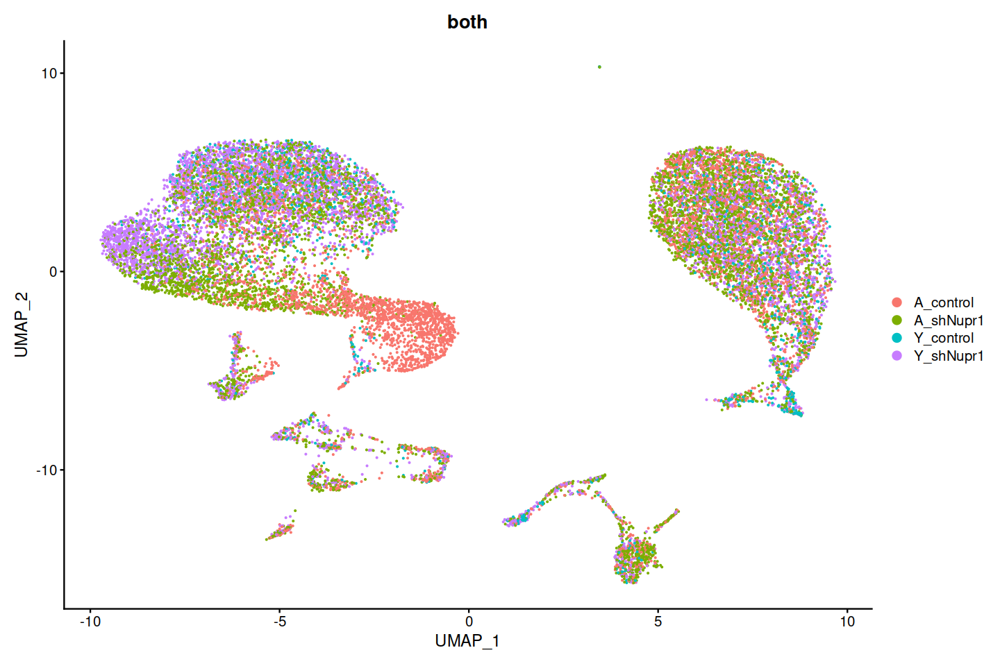

In [25]:
p3=DimPlot(obj, reduction = "umap", group.by = 'both')
p3

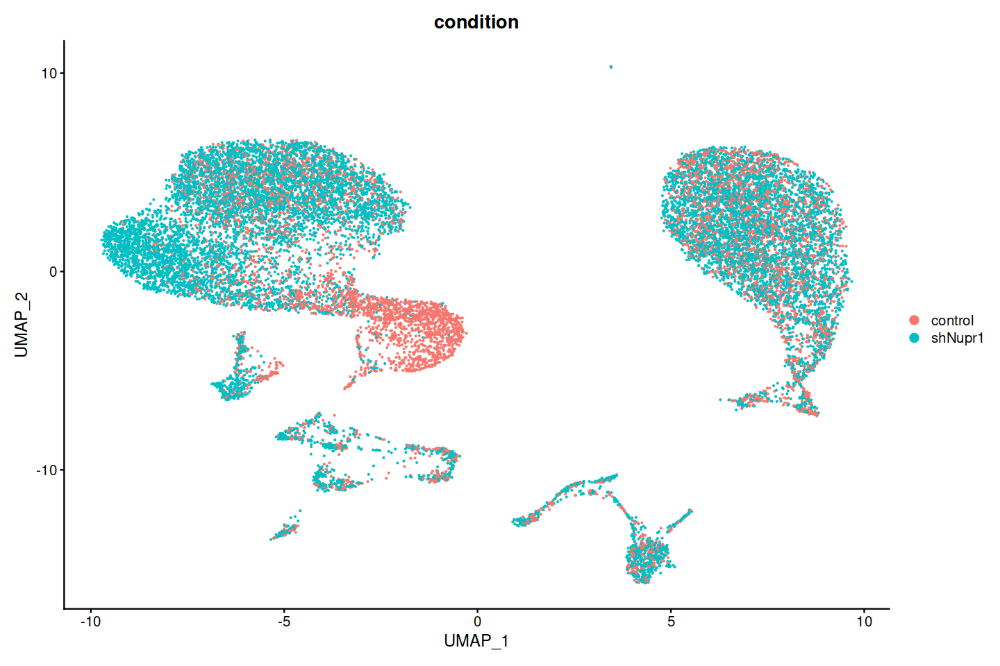

In [26]:
DimPlot(obj, reduction = "umap", group.by = 'condition')

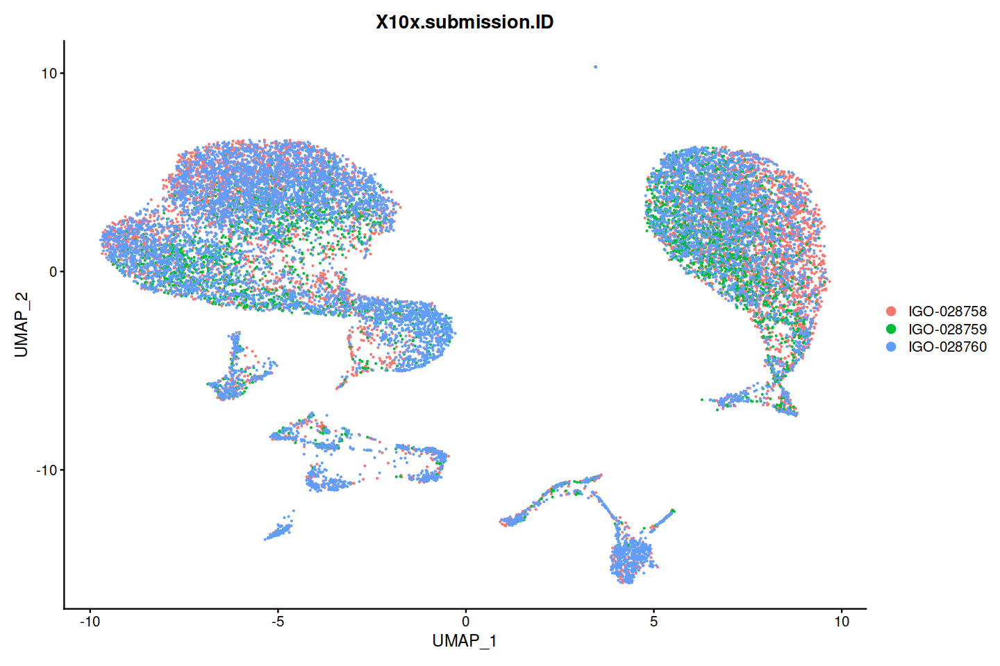

In [27]:
p4=DimPlot(obj, reduction = "umap", group.by = 'X10x.submission.ID')
p4

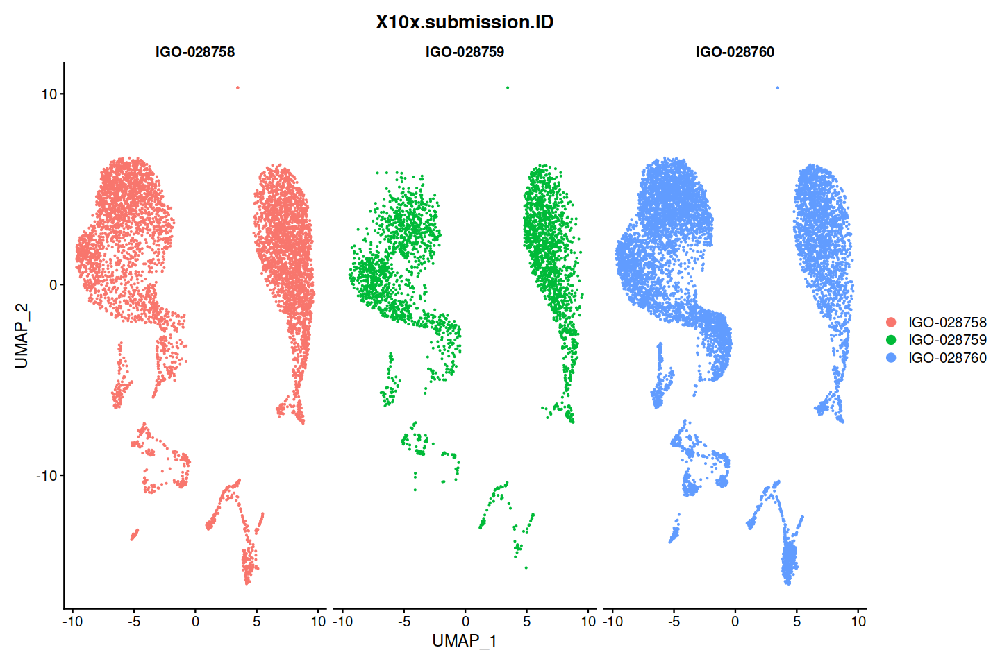

In [28]:
DimPlot(obj, reduction = "umap", group.by = 'X10x.submission.ID', split.by='X10x.submission.ID')

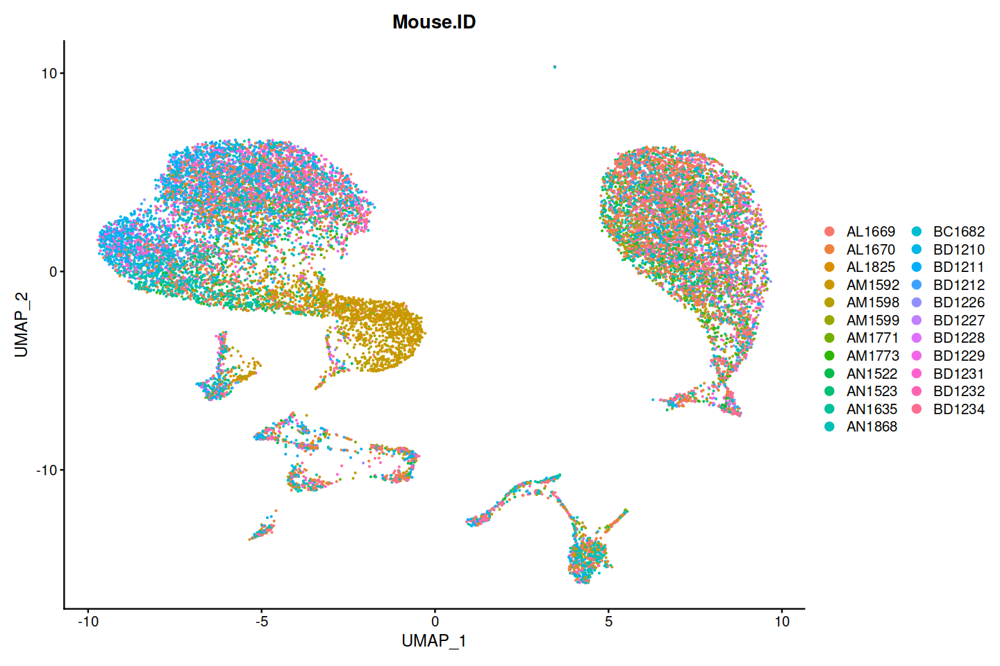

In [29]:
p5=DimPlot(obj, reduction = "umap", group.by = 'Mouse.ID')
p5

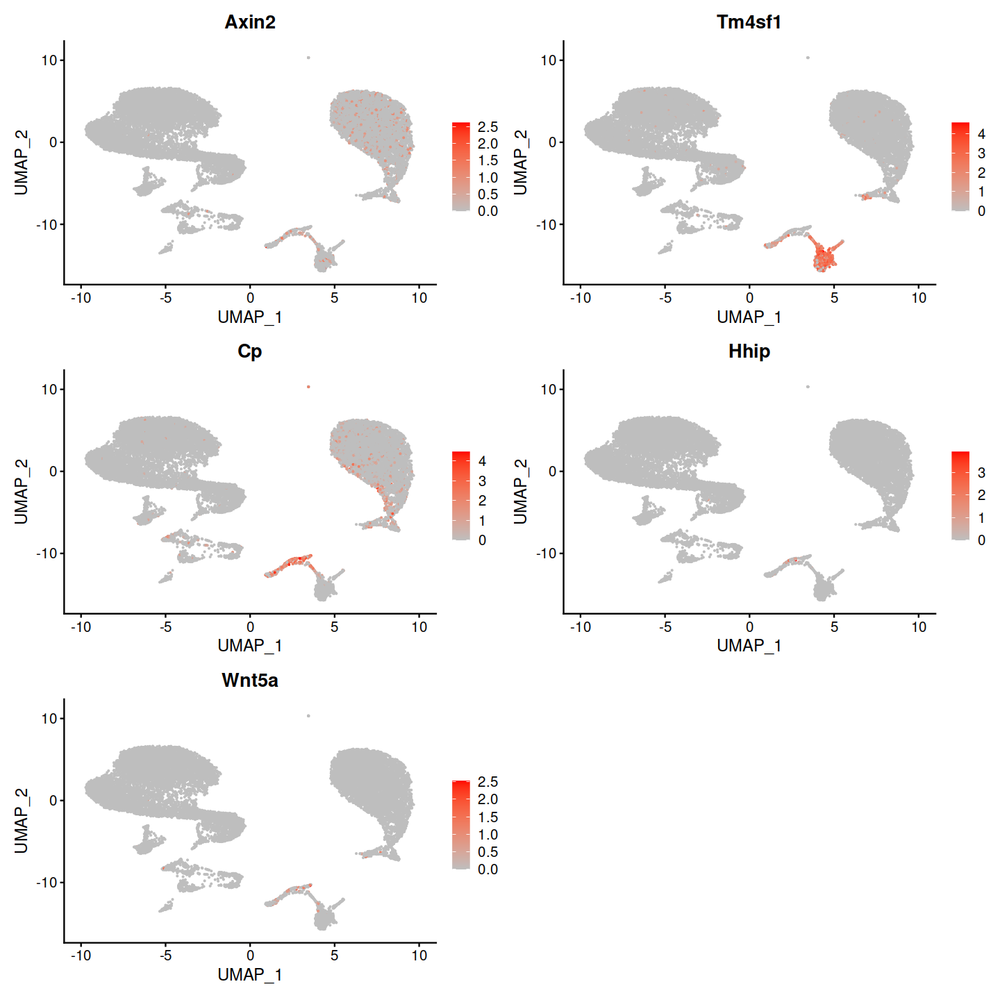

In [30]:
#AT2S marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c('Axin2', 'Tm4sf1', 'Cp', 'Hhip', 'Wnt5a'),  ncol =2, cols = c("grey", "red"))

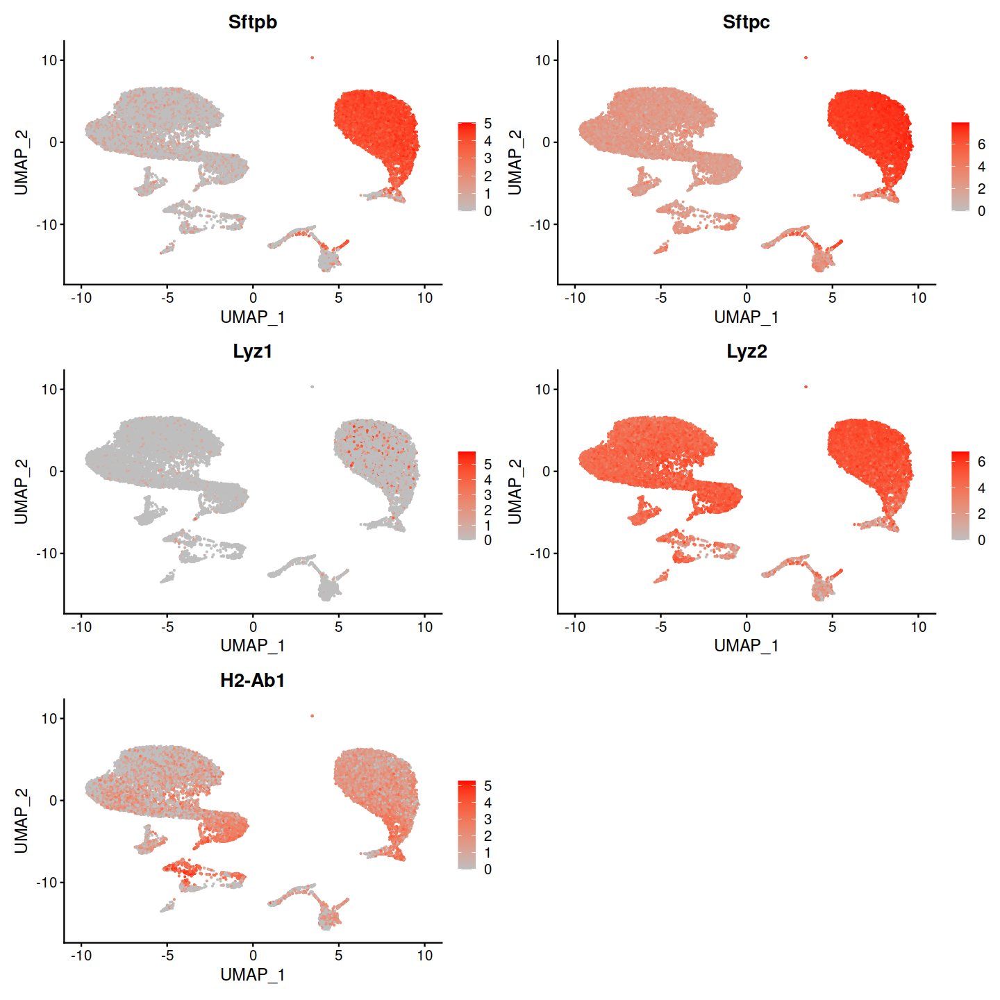

In [31]:
#AT2 marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c('Sftpb', 'Sftpc', 'Lyz1', 'Lyz2', 'H2-Ab1'),  ncol =2, cols = c("grey", "red"))

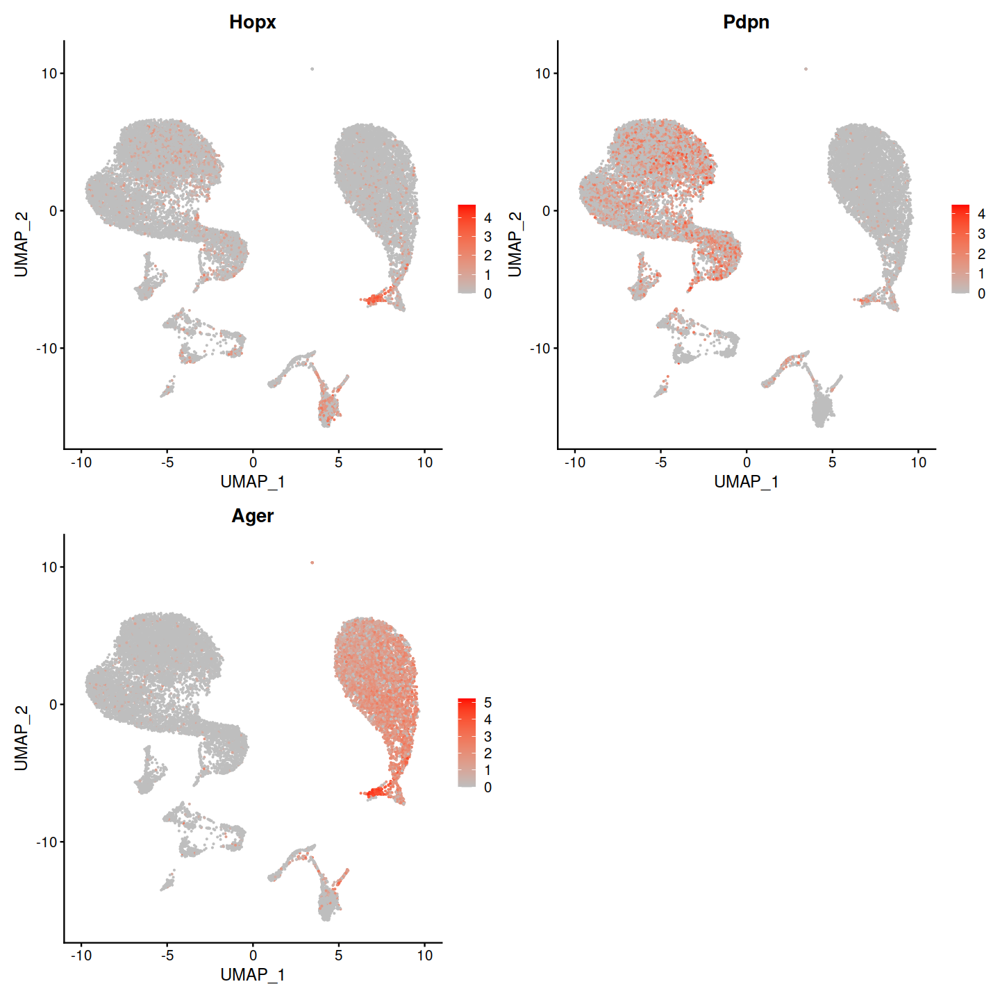

In [32]:
#AT1 marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c('Hopx', 'Pdpn', 'Ager'),  ncol =2, cols = c("grey", "red"))

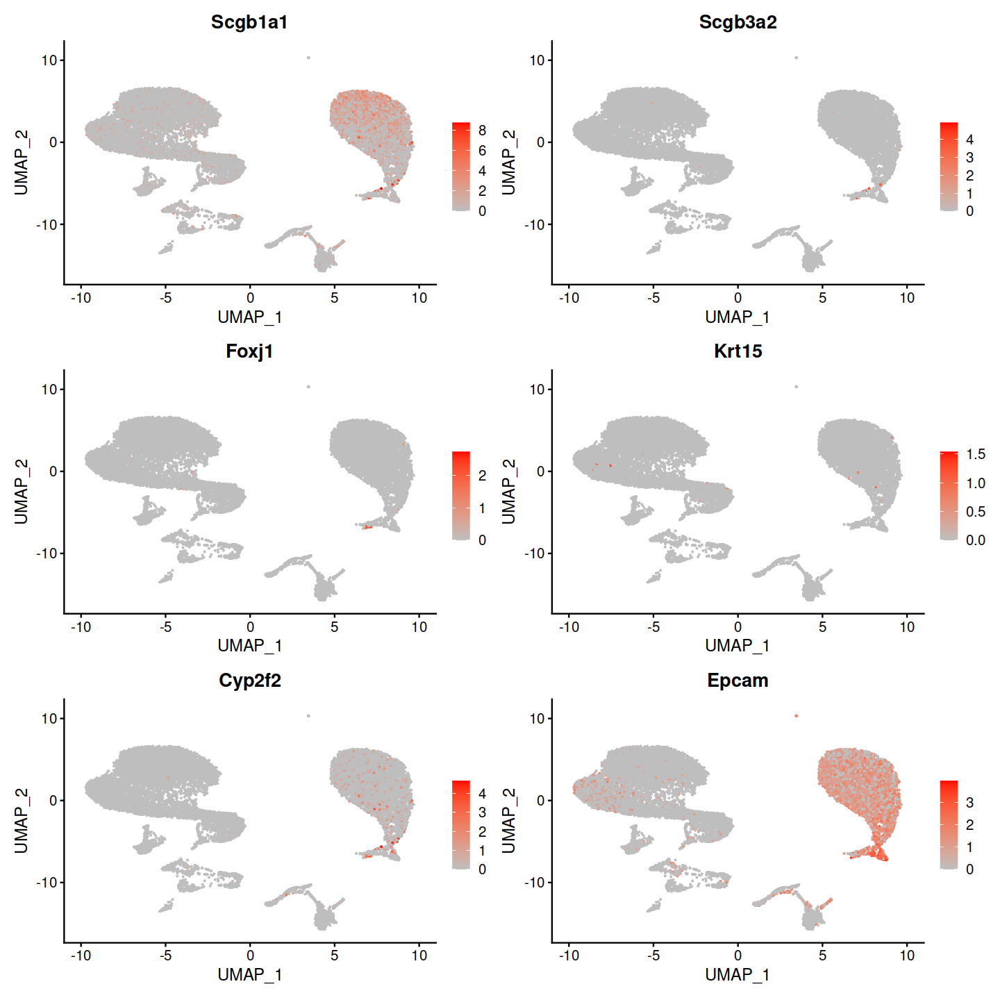

In [33]:
#bronchiolar_epithelial_marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c('Scgb1a1', 'Scgb3a2', 'Foxj1', "Krt15", "Cyp2f2",'Epcam'),  ncol =2, cols = c("grey", "red"))

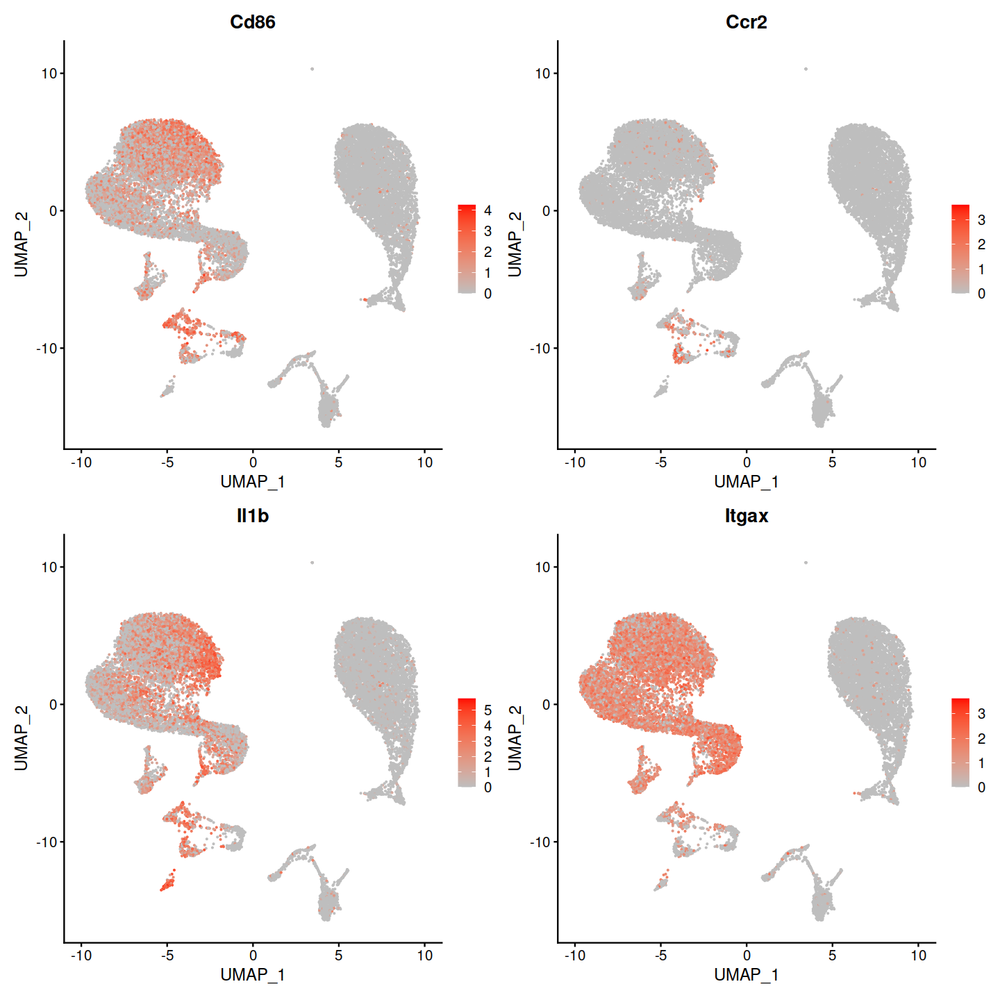

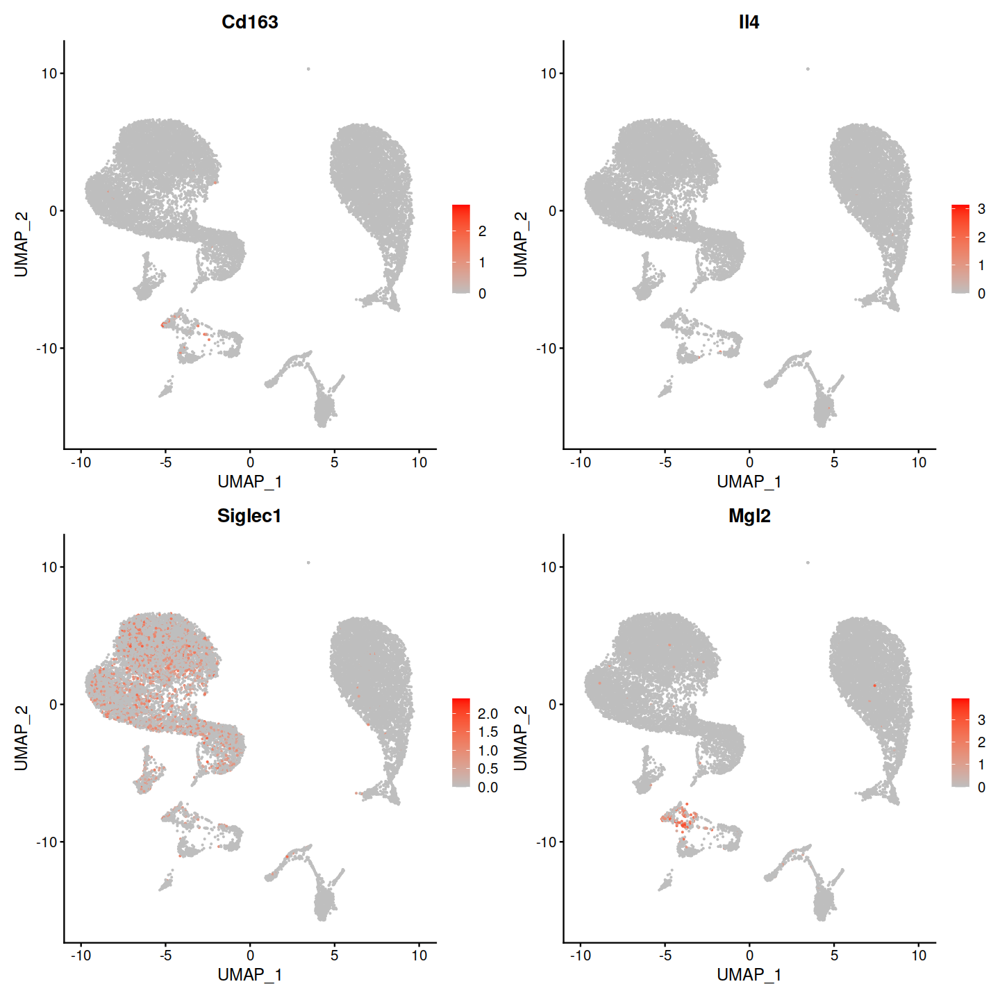

In [34]:
M1 = c('Cd86',
'Ccr2',
'Il1b',
'Itgax')

M2 = c('Cd163',
'Il4',
'Siglec1',
'Mgl2')

FeaturePlot(obj, reduction = "umap", features = M1,  ncol =2, cols = c("grey", "red"))
FeaturePlot(obj, reduction = "umap", features = M2,  ncol =2, cols = c("grey", "red"))

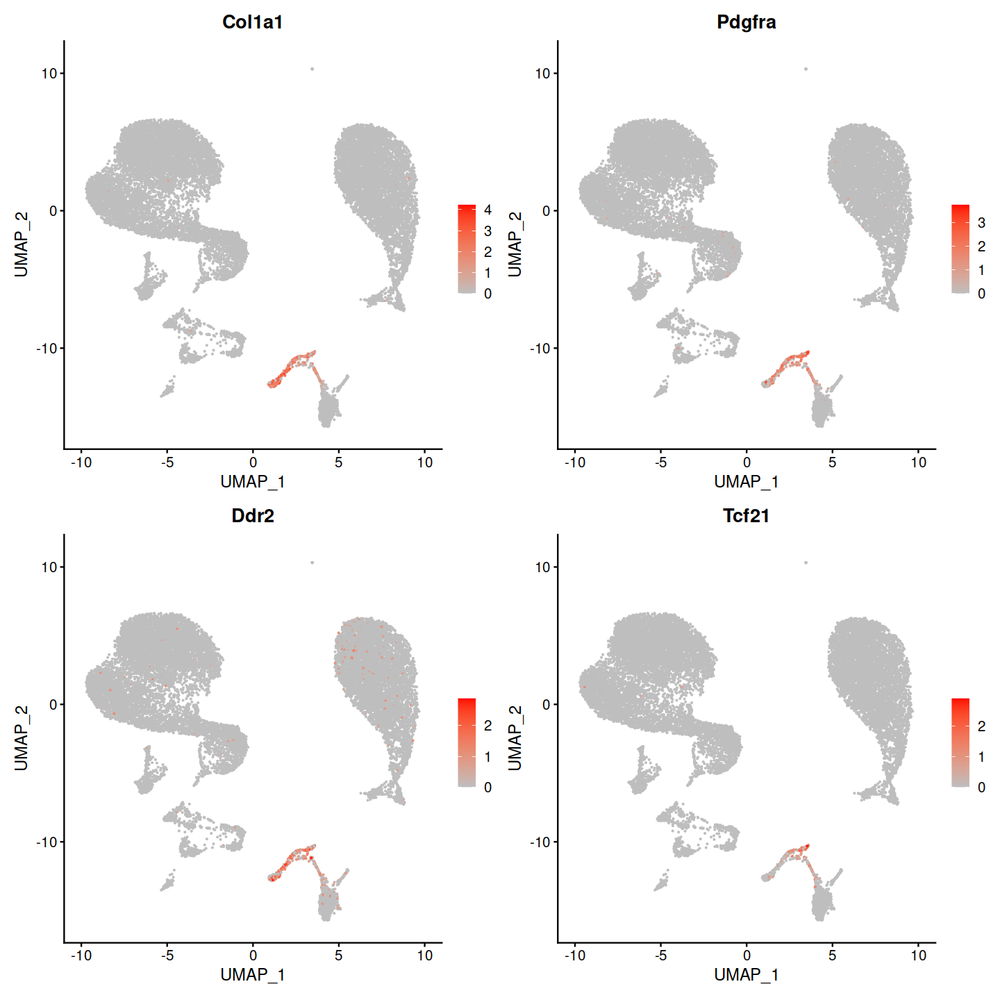

In [35]:
#fibroblast marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c("Col1a1", "Pdgfra","Ddr2", "Tcf21"),  ncol =2, cols = c("grey", "red"))

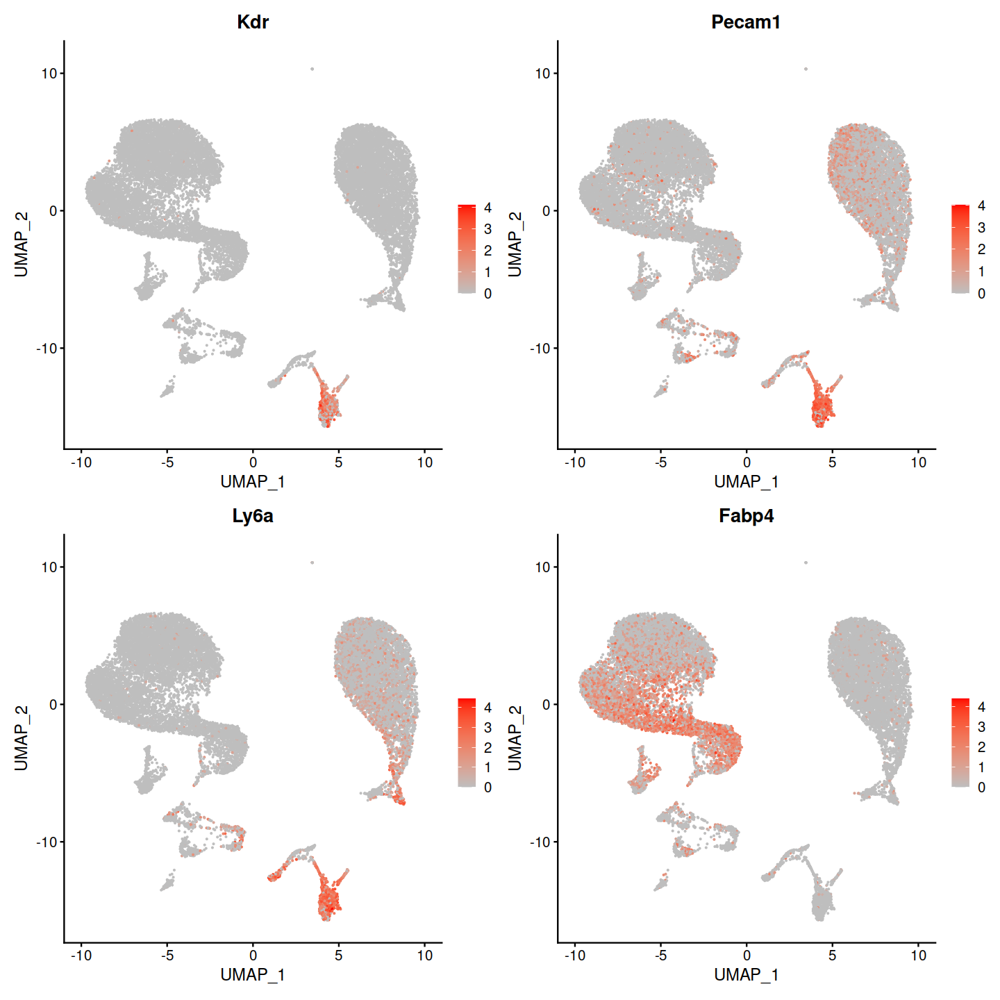

In [36]:
#endothelial marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c("Kdr", "Pecam1","Ly6a", "Fabp4"),  ncol =2, cols = c("grey", "red"))

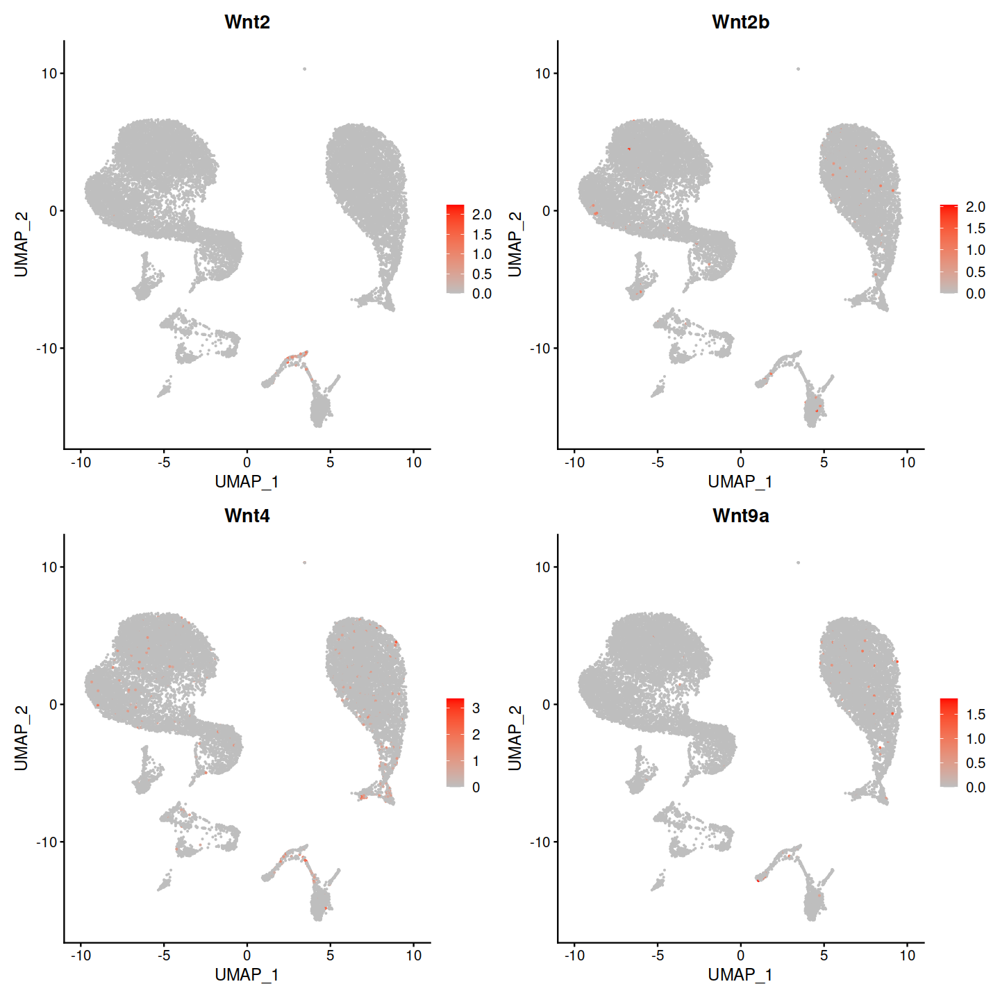

In [37]:
#wnt_gene
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction='umap', features = c("Wnt2", "Wnt2b","Wnt4", "Wnt9a"),  ncol =2, cols = c("grey", "red"))

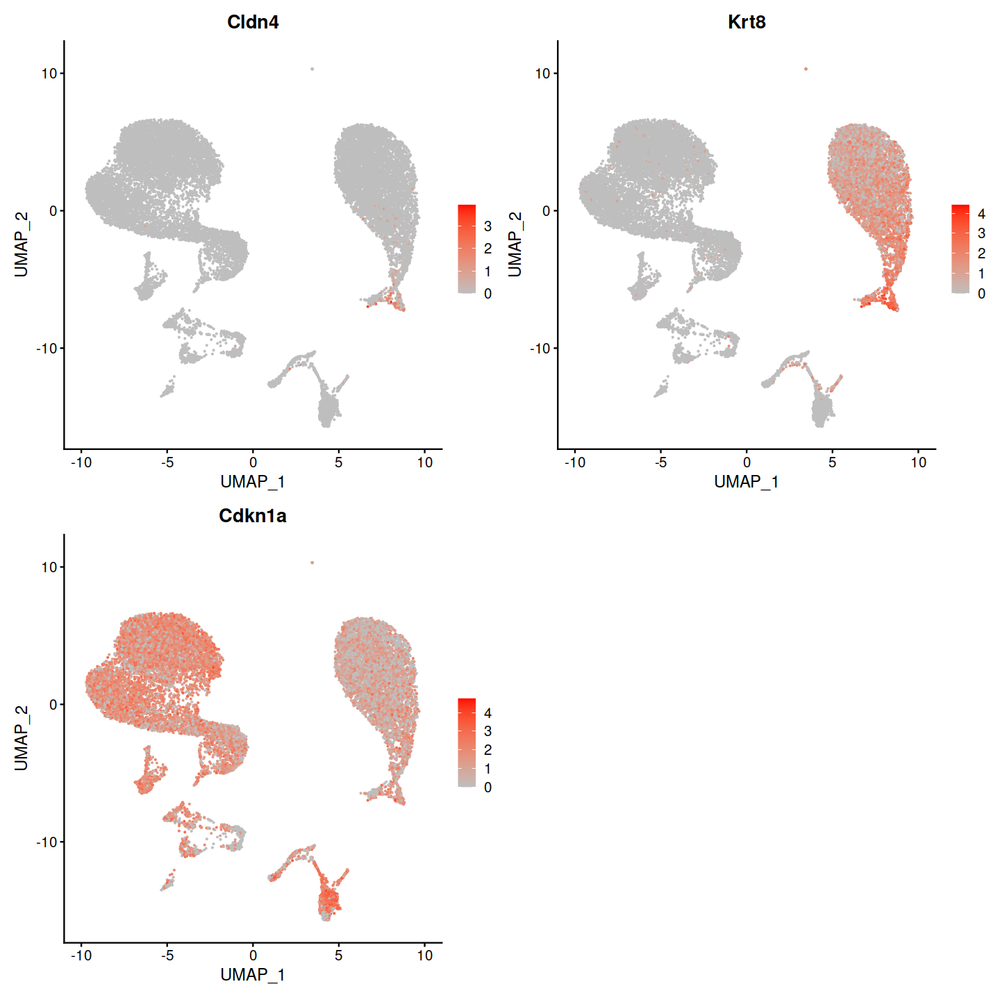

In [38]:
#DATP marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction='umap', features = c("Cldn4", "Krt8", "Cdkn1a"),  ncol =2, cols = c("grey", "red"))

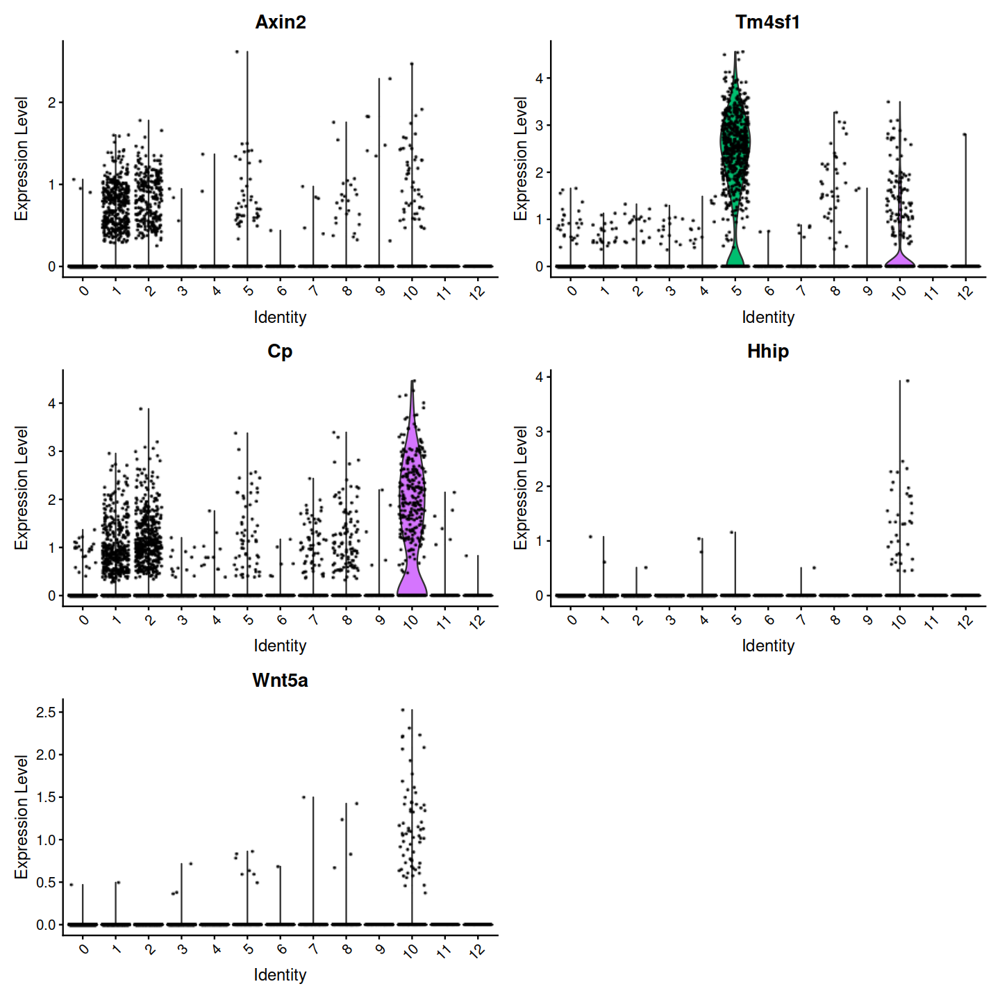

In [39]:
VlnPlot(obj, features = c('Axin2', 'Tm4sf1', 'Cp', 'Hhip', 'Wnt5a'),  ncol =2)

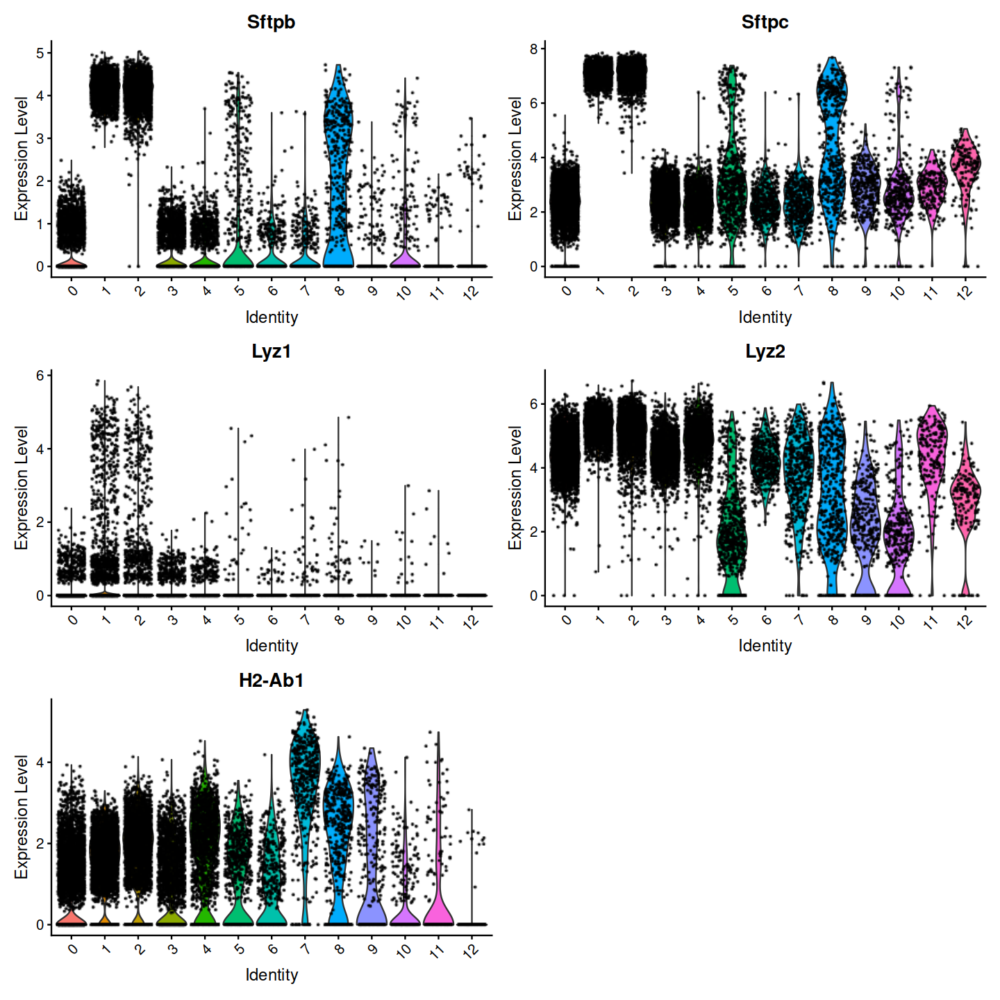

In [40]:
VlnPlot(obj,  features = c('Sftpb', 'Sftpc', 'Lyz1', 'Lyz2', 'H2-Ab1'),  ncol =2)

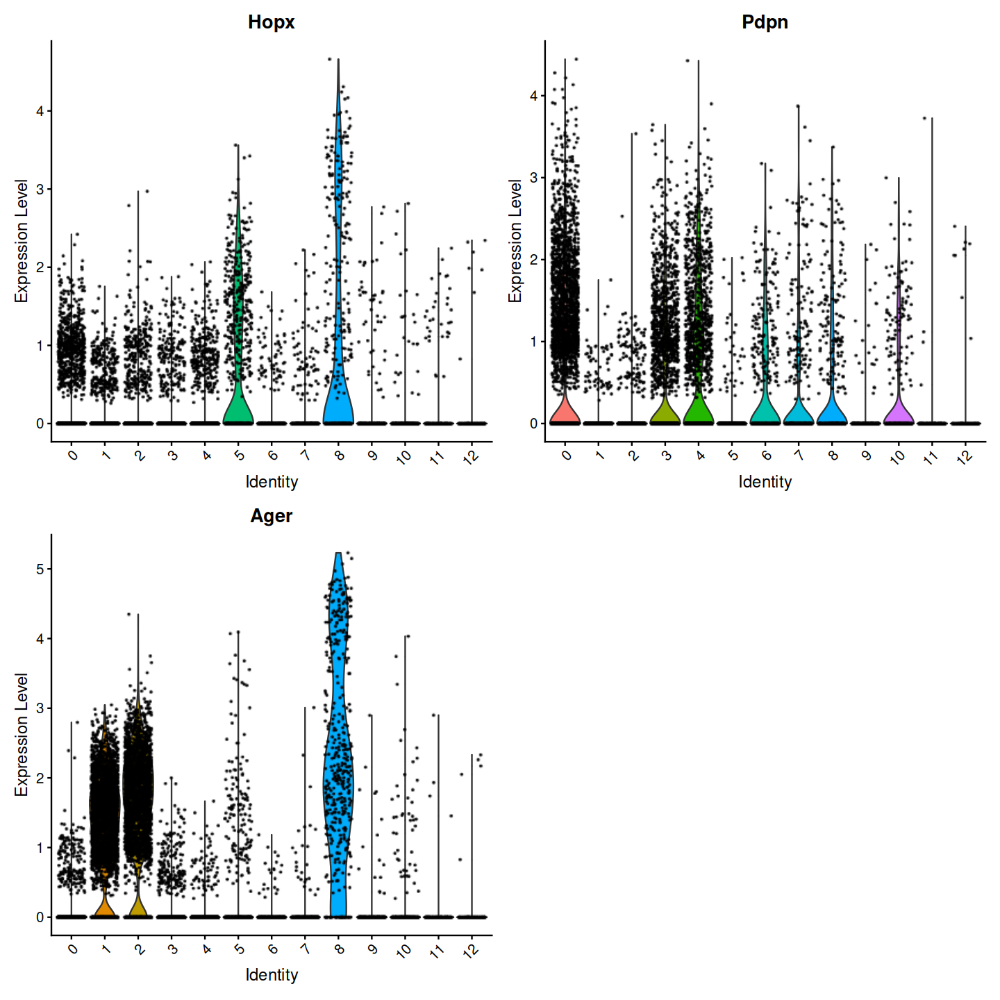

In [41]:
VlnPlot(obj,  features = c('Hopx', 'Pdpn', 'Ager'),  ncol =2)

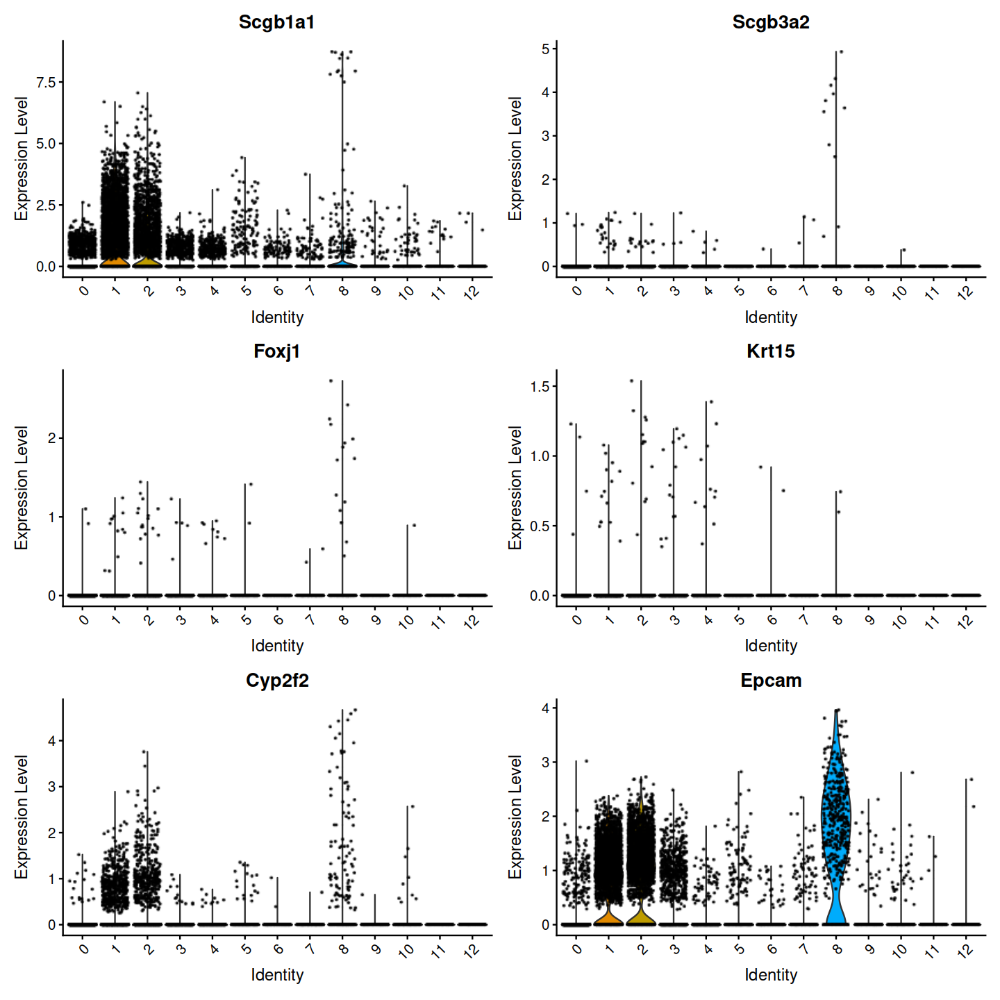

In [42]:
VlnPlot(obj,  features = c('Scgb1a1', 'Scgb3a2', 'Foxj1', "Krt15", "Cyp2f2",'Epcam'),  ncol =2)

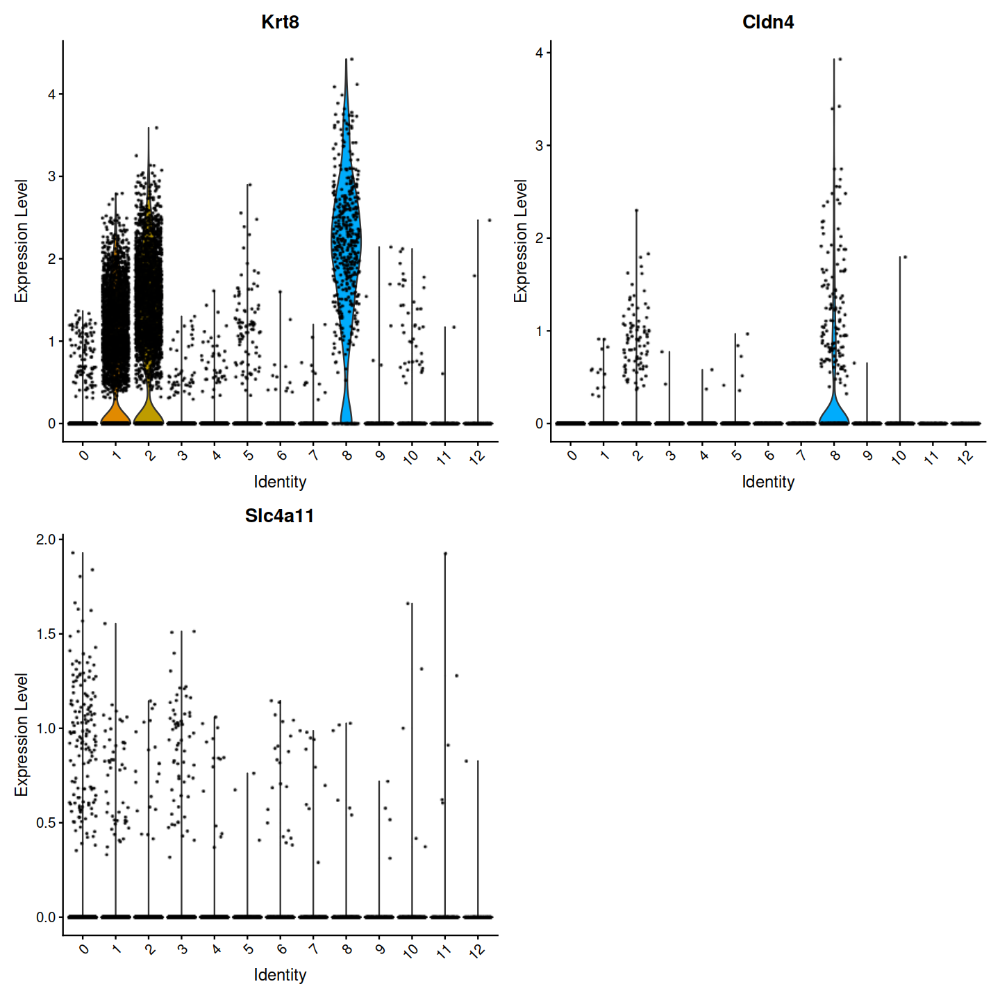

In [43]:
VlnPlot(obj,  features = c('Krt8', 'Cldn4', 'Slc4a11'),  ncol =2)

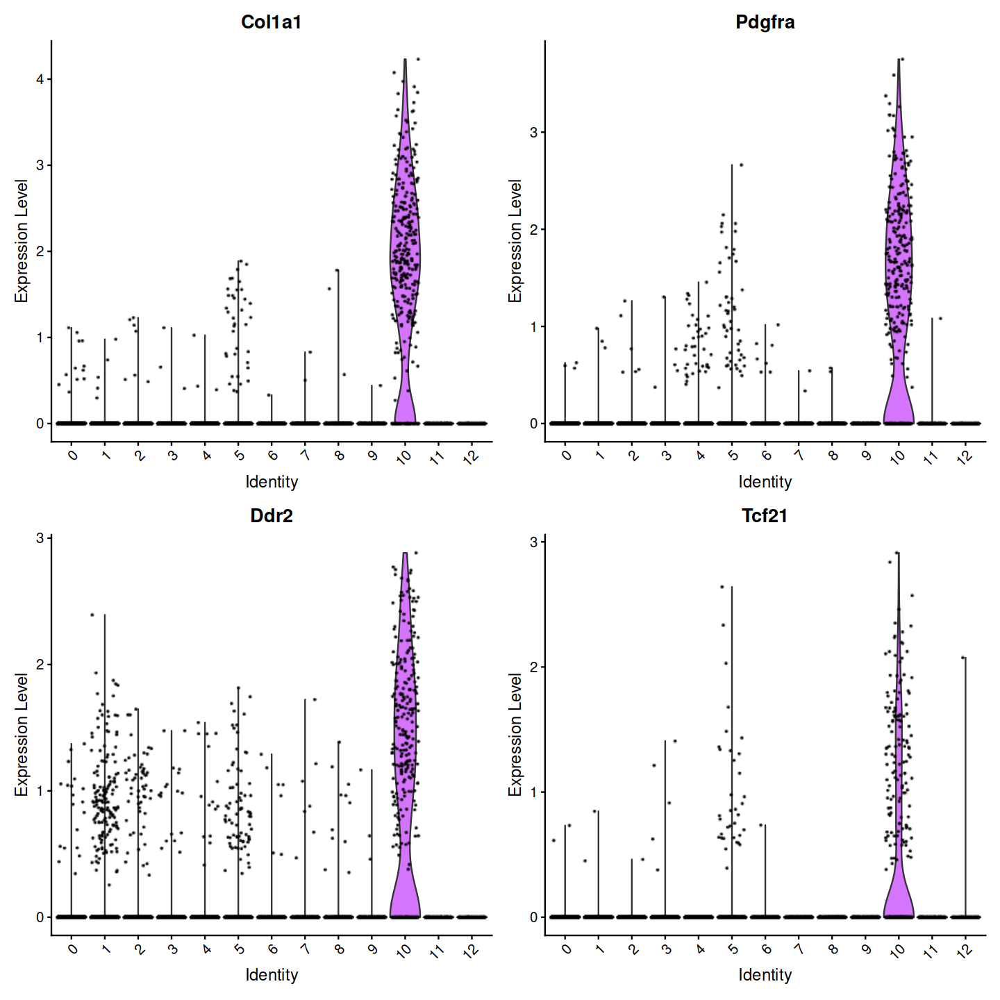

In [44]:
VlnPlot(obj,  features = c("Col1a1", "Pdgfra","Ddr2", "Tcf21"),  ncol =2)

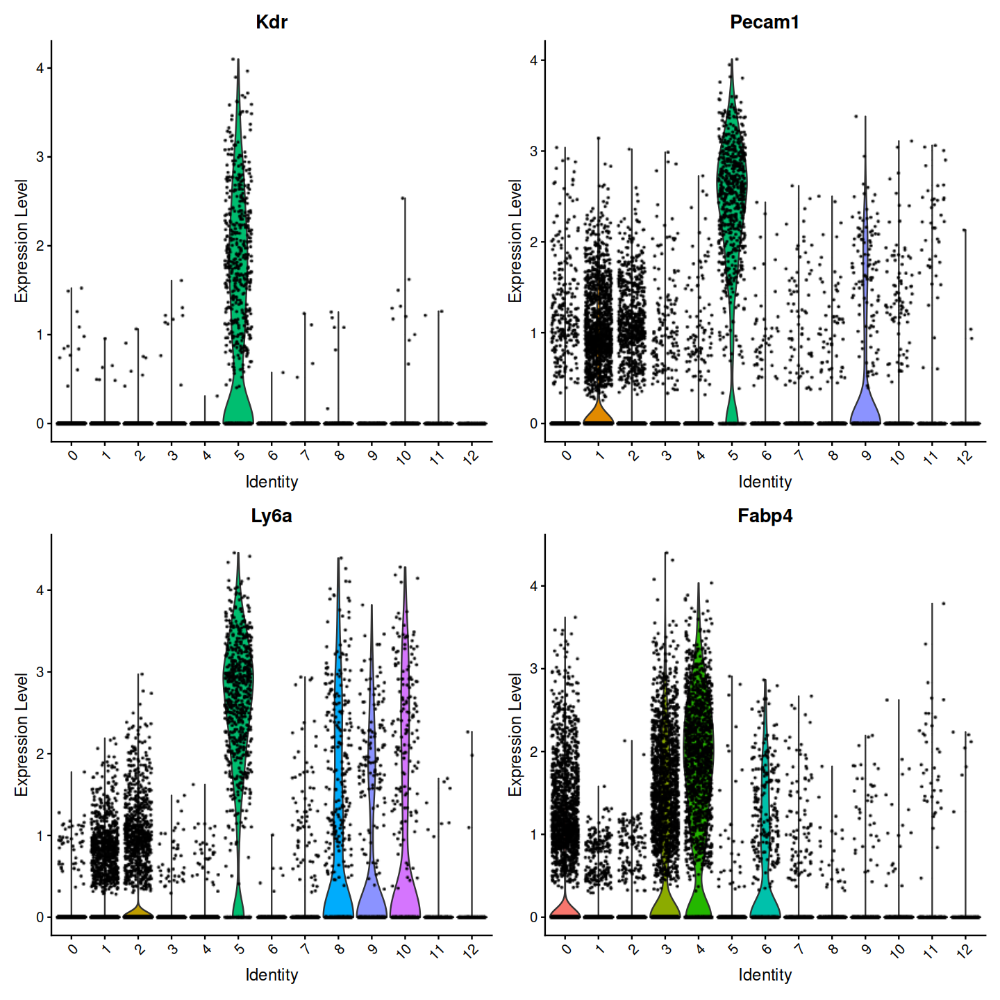

In [45]:
VlnPlot(obj,  features = c("Kdr", "Pecam1","Ly6a", "Fabp4"),  ncol =2)

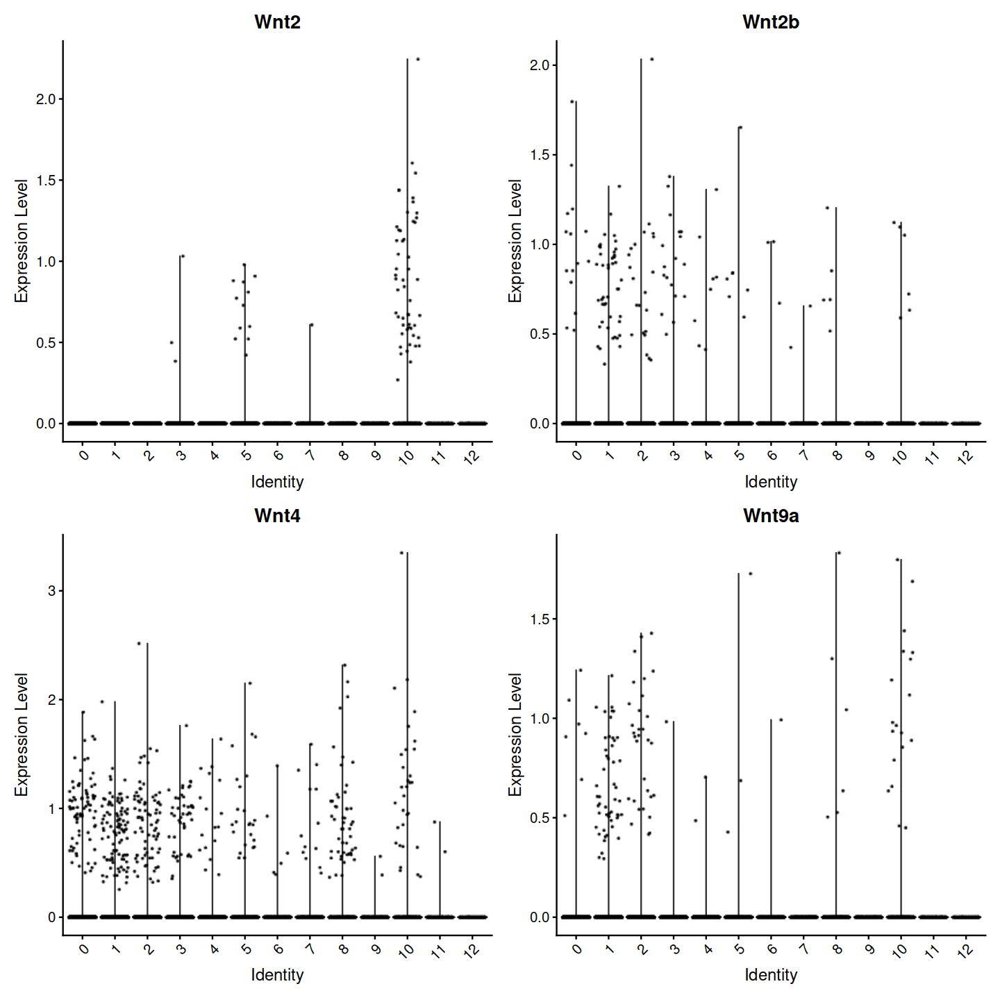

In [46]:
VlnPlot(obj,  features = c("Wnt2", "Wnt2b","Wnt4", "Wnt9a"),  ncol =2)

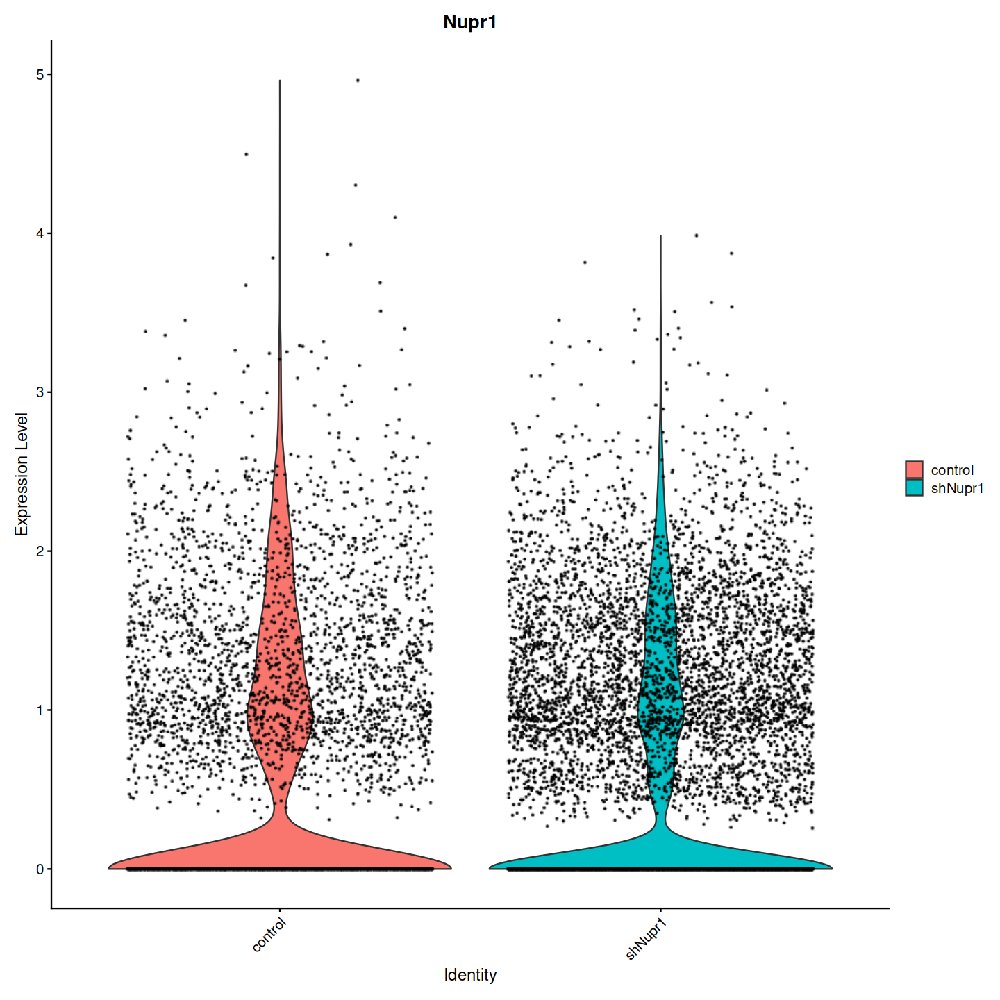

In [47]:
VlnPlot(obj,  features = c("Nupr1"),  group.by=c('condition'))

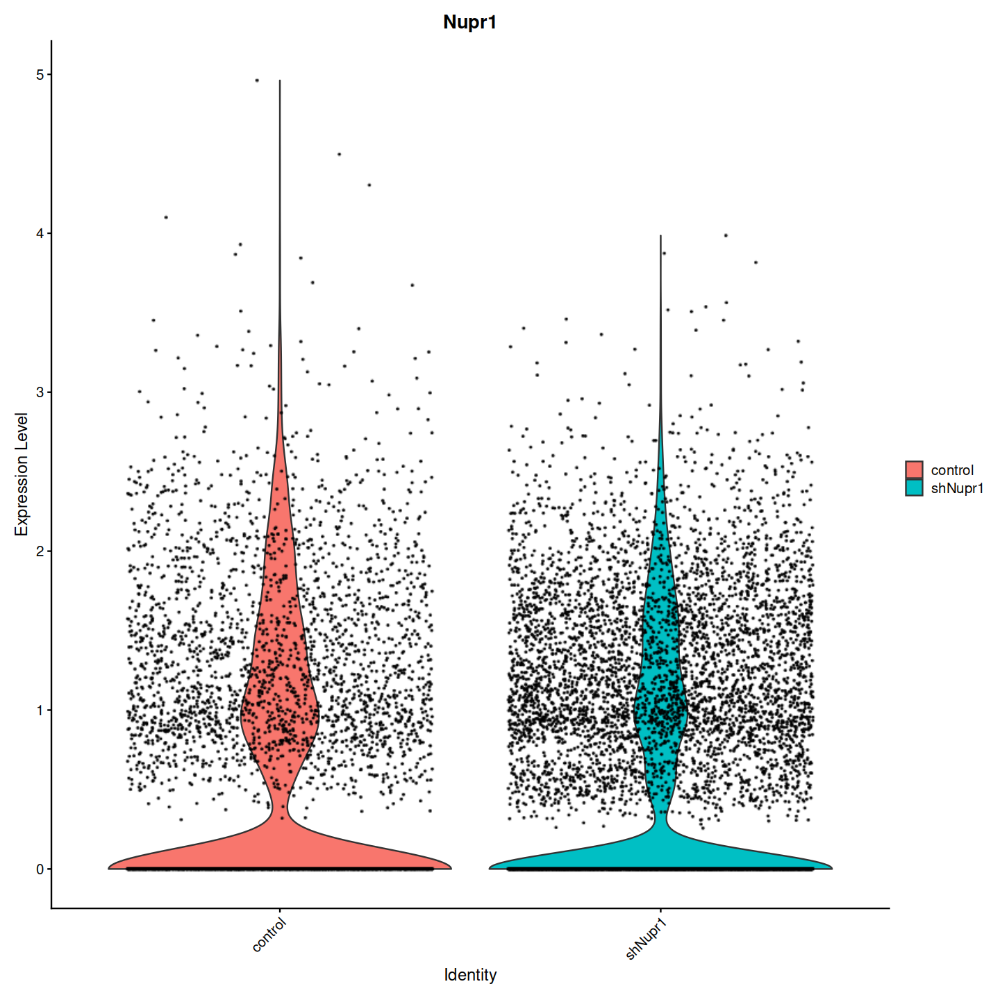

In [53]:
VlnPlot(subset(obj, GFP>0),  features = c("Nupr1"),  group.by=c('condition'))

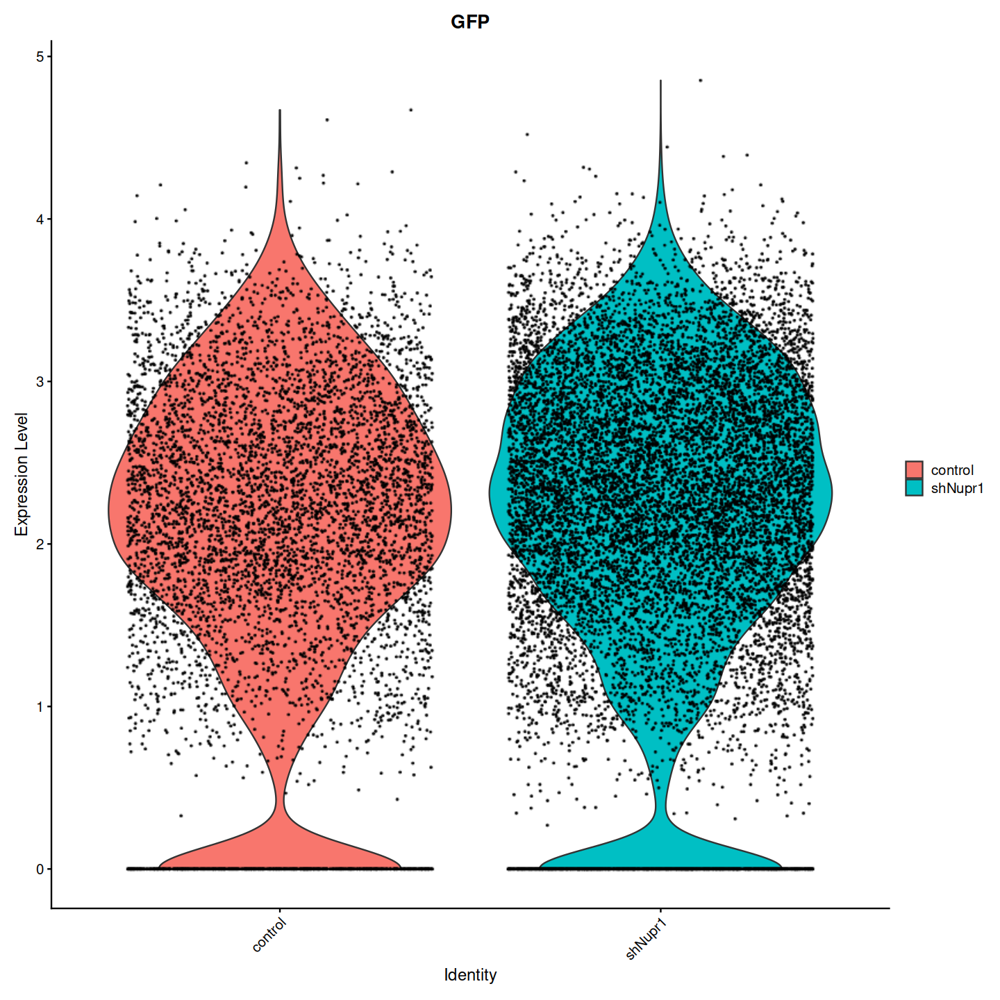

In [52]:
VlnPlot(obj,  features = c("GFP"),  group.by=c('condition'))

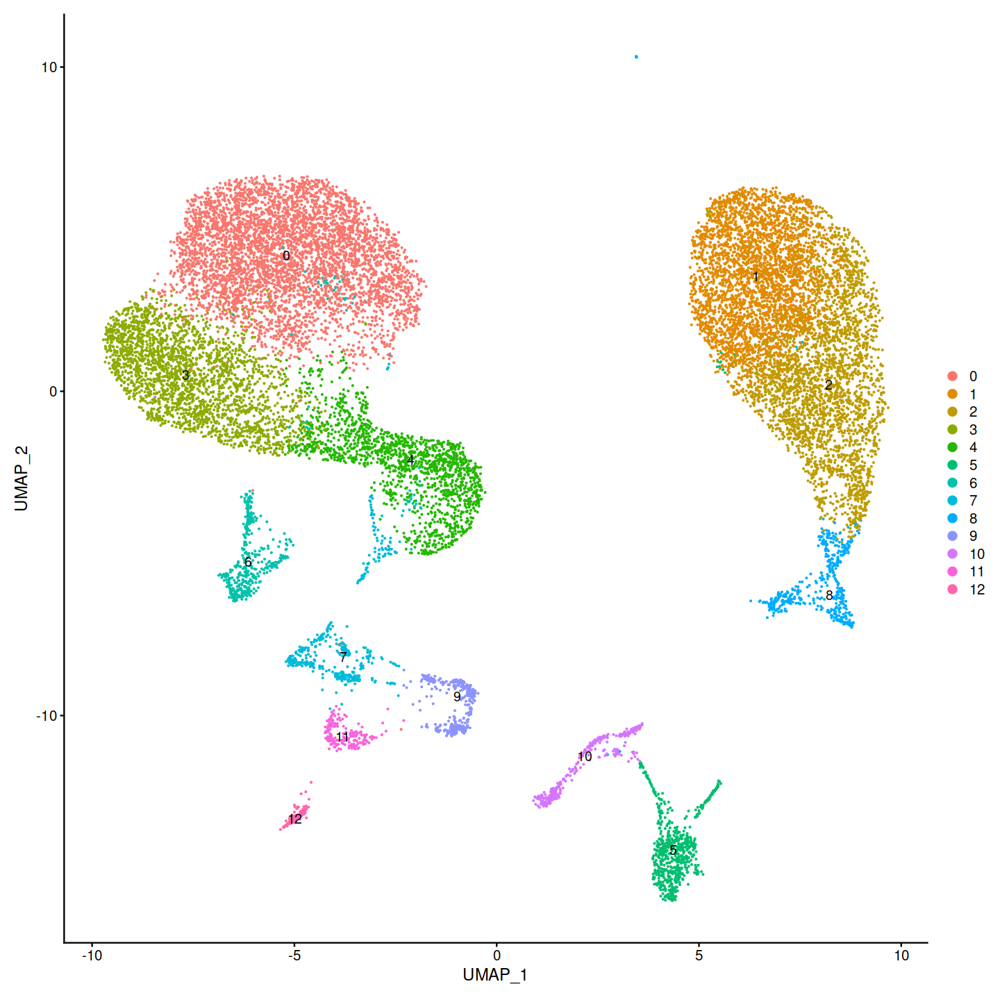

In [49]:
p1

In [50]:
saveRDS(obj, file='/g/data/zk16/qing/tuomas/shNupr1_scRNA/04combine/shNupr1_scRNA_merge_defaultlogNorm.rds')

In [1]:
obj=readRDS('/g/data/zk16/qing/tuomas/shNupr1_scRNA/04combine/shNupr1_scRNA_merge_defaultlogNorm.rds')

In [6]:
meta=obj[[]]
colnames(meta)

[1] "orig.ident"                 "nCount_RNA"                
 [3] "nFeature_RNA"               "nCount_HTO"                
 [5] "nFeature_HTO"               "hash"                      
 [7] "Submission.date"            "Mouse.ID"                  
 [9] "Hashtag.ID"                 "Hashtag.sequence"          
[11] "shRNA.group"                "Age"                       
[13] "Sex"                        "GFP..Epithelial.cells"     
[15] "GFP..other.cells"           "Cells.for.submission"      
[17] "X10x.submission.ID"         "X10x.sequencing.data.ID"   
[19] "Hashtag.sequencing.data.ID" "Hashtag"                   
[21] "percent.mt"                 "percent.ribo"              
[23] "RNA_snn_res.0.5"            "seurat_clusters"           
[25] "condition"                  "both"

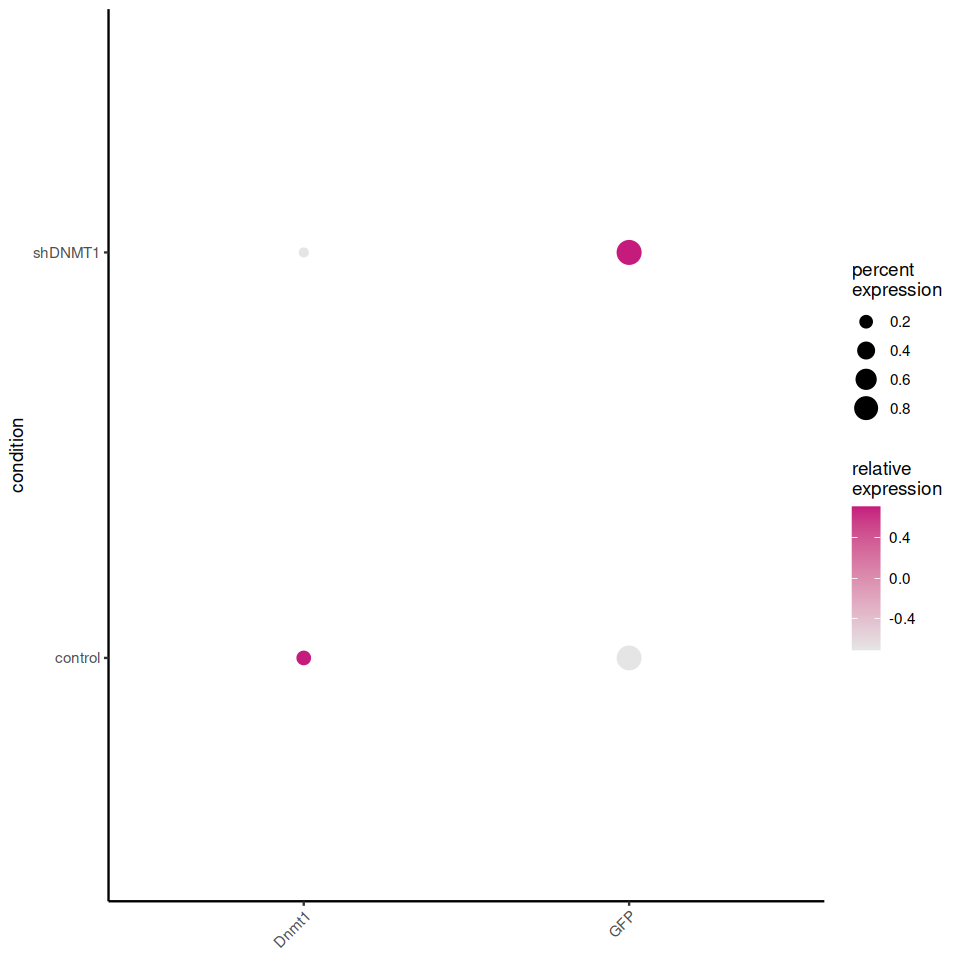

ERROR: Error in FeaturePlot(obj, reduction = "umap", features = c("GFP"), group.by = "condition", : unused argument (group.by = "condition")


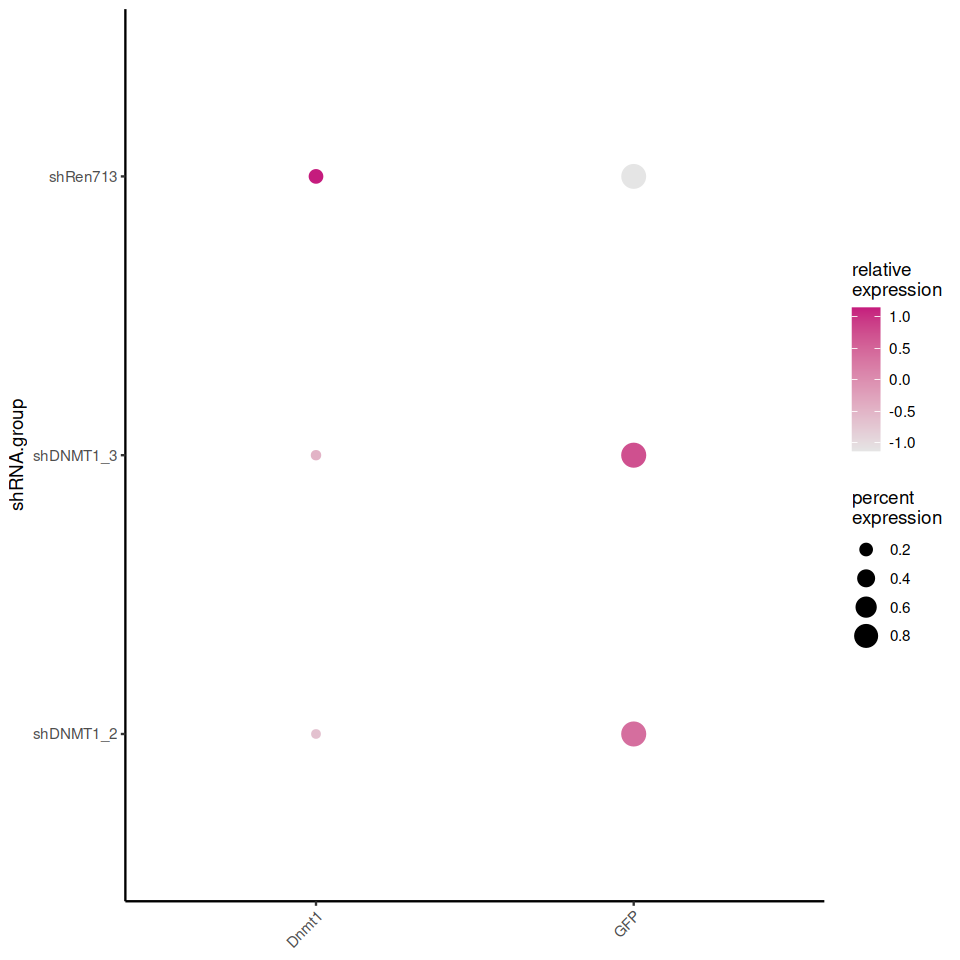

In [ ]:
#dot plot for sanity check 
options(repr.plot.width=8, repr.plot.height=8)
library(dittoSeq)
dittoDotPlot(obj, vars = c('Nupr1','GFP'), group.by = "condition")
dittoDotPlot(obj, vars = c('Nupr1','GFP'), group.by = "shRNA.group")

#save
pdf('/g/data/zk16/qing/tuomas/shNupr1_scRNA/04combine/sanity_check_GFP_shNupr1.pdf')
dittoDotPlot(obj, vars = c('Nupr1','GFP'), group.by = "condition")
dittoDotPlot(obj, vars = c('Nupr1','GFP'), group.by = "shRNA.group")
VlnPlot(obj,  features = c("Nupr1", 'GFP'),  group.by=c('condition'))
VlnPlot(obj,  features = c("Nupr1", 'GFP'),  group.by=c('shRNA.group'))
FeaturePlot(obj, reduction = "umap", features =c('GFP','Nupr1', 'tdtomato', 'Cre'))
FeaturePlot(obj, reduction = "umap", features =c('GFP'), group.by='condition', split.by='condition')
FeaturePlot(obj, reduction = "umap", features =c('Nupr1'), group.by='condition', split.by='condition')
FeaturePlot(obj, reduction = "umap", features =c('GFP'), group.by='condition', split.by='shRNA.group')
FeaturePlot(obj, reduction = "umap", features =c('Nupr1'), group.by='condition', split.by='shRNA.group')
dev.off()

In [69]:
#feature gene umap
pdf('/g/data/zk16/qing/tuomas/shNupr1_scRNA/04combine/combine_umap.pdf')
p1
p2
p3
p4
p5
dev.off()


png 
  2

In [ ]:
obj=readRDS('/g/data/zk16/qing/tuomas/shNupr1_scRNA/04combine/shNupr1_scRNA_merge_defaultlogNorm.rds')

In [61]:
head(obj)

,orig.ident,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,hash,Submission.date,Mouse.ID,Hashtag.ID,Hashtag.sequence,...,X10x.submission.ID,X10x.sequencing.data.ID,Hashtag.sequencing.data.ID,Hashtag,percent.mt,percent.ribo,RNA_snn_res.0.5,seurat_clusters,condition,both
,<chr>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<fct>,<fct>,<chr>,<chr>
IGO_028755_AAACCCAAGACACACG-1,SeuratProject,6873,2509,4676,8,B0306-TotalSeqB,NA,BE1055,HTO-6,TATGCTGCCACGGTA,...,IGO-028755,NA,NA,B0306,2.109705,0.03942965,1,1,shDNMT1,Y_shDNMT1
IGO_028755_AAACCCAAGCGCATCC-1,SeuratProject,9110,3325,9278,8,B0305-TotalSeqB,NA,BD1662,HTO-5,CTTTGTCTTTGTGAG,...,IGO-028755,NA,NA,B0305,1.800220,0.05257958,7,7,control,Y_control
IGO_028755_AAACCCAAGCGCTGAA-1,SeuratProject,5342,2112,307,8,B0307-TotalSeqB,NA,BE1056,HTO-7,GAGTCTGCCAGTATC,...,IGO-028755,NA,NA,B0307,2.976413,0.05409959,1,1,shDNMT1,Y_shDNMT1
IGO_028755_AAACCCAAGCTGGCCT-1,SeuratProject,7166,2765,290,8,B0307-TotalSeqB,NA,BE1056,HTO-7,GAGTCTGCCAGTATC,...,IGO-028755,NA,NA,B0307,1.911806,0.04967904,1,1,shDNMT1,Y_shDNMT1
IGO_028755_AAACCCAAGGAGGTTC-1,SeuratProject,7470,3046,5613,8,B0308-TotalSeqB,NA,BE1061,HTO-8,TATAGAACGCCAGGC,...,IGO-028755,NA,NA,B0308,2.423025,0.06880857,6,6,control,Y_control
IGO_028755_AAACCCACAGACCAGA-1,SeuratProject,6056,2653,13689,8,B0301-TotalSeqB,7/25/2023,AM1769,HTO-1,ACCCACCAGTAAGAC,...,IGO-028755,20230725_shDNMT1_IGO_14863_C_1,20230725_shDNMT1_FB_IGO_14863_D_1,B0301,2.608983,0.03418098,0,0,control,A_control
IGO_028755_AAACCCAGTACGTGAG-1,SeuratProject,9927,2993,12775,8,B0304-TotalSeqB,NA,BD1620,HTO-4,AAAGCATTCTTCACG,...,IGO-028755,NA,NA,B0304,1.783016,0.10275008,3,3,shDNMT1,Y_shDNMT1
IGO_028755_AAACCCAGTGAATGAT-1,SeuratProject,2353,1413,613,8,B0301-TotalSeqB,7/25/2023,AM1769,HTO-1,ACCCACCAGTAAGAC,...,IGO-028755,20230725_shDNMT1_IGO_14863_C_1,20230725_shDNMT1_FB_IGO_14863_D_1,B0301,1.572461,0.03782405,12,12,control,A_control
IGO_028755_AAACCCAGTGGAACAC-1,SeuratProject,6869,2508,1299,8,B0302-TotalSeqB,NA,AN1529,HTO-2,GGTCGAGAGCATTCA,...,IGO-028755,NA,NA,B0302,1.790654,0.08720338,5,5,control,A_control


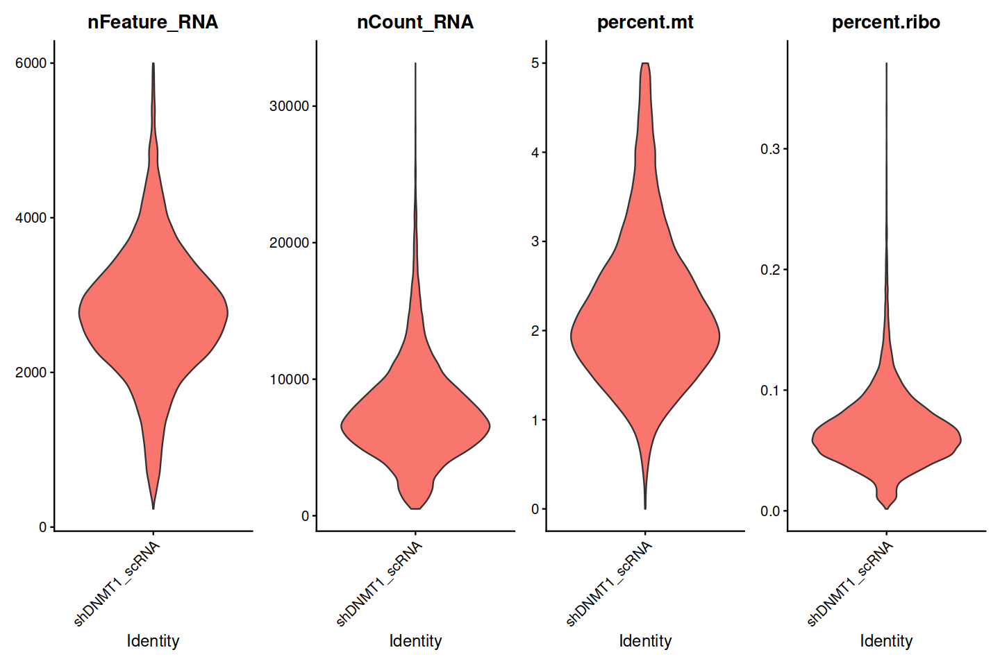

In [62]:

Idents(obj)='shNupr1_scRNA'

library(ggplot2)
VlnPlot(obj, features = c("nFeature_RNA", "nCount_RNA", "percent.mt", "percent.ribo"), ncol = 4, pt.size=0)

In [58]:
table(obj$X10x.submission.ID)


IGO-028755 IGO-028756 IGO-028761 
      8020       8040       4856 

In [59]:
obj

An object of class Seurat 
32891 features across 20916 samples within 1 assay 
Active assay: RNA (32891 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

In [60]:
sessionInfo()

R version 4.0.0 (2020-04-24)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Rocky Linux 8.8 (Green Obsidian)

Matrix products: default
BLAS/LAPACK: /apps/intel/compilers_and_libraries_2019.5.281/linux/mkl/lib/intel64_lin/libmkl_intel_lp64.so

locale:
 [1] LC_CTYPE=C.UTF-8    LC_NUMERIC=C        LC_TIME=C          
 [4] LC_COLLATE=C        LC_MONETARY=C       LC_MESSAGES=C      
 [7] LC_PAPER=C          LC_NAME=C           LC_ADDRESS=C       
[10] LC_TELEPHONE=C      LC_MEASUREMENT=C    LC_IDENTIFICATION=C

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] ggplot2_3.3.3      SeuratObject_4.0.4 Seurat_4.1.0      

loaded via a namespace (and not attached):
  [1] Rtsne_0.15            ggbeeswarm_0.6.0      colorspace_2.0-0     
  [4] deldir_1.0-6          ggridges_0.5.3        IRdisplay_1.1        
  [7] base64enc_0.1-3       spatstat.data_3.0-0   leiden_0.3.7         
 [10] listenv_0.8.0         farver_2

In [ ]:
#9. find marker genes for each cluster
obj.markers <- FindAllMarkers(obj, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
library(dplyr)
obj.markers %>%
    group_by(cluster) %>%
    slice_max(n = 5, order_by = avg_log2FC)


Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6



In [ ]:
#save csv
write.csv(obj.markers, file='/g/data/zk16/qing/tuomas/scRNA_aging_exercise/feb2021/DEGv3/cluster_marker.csv')

In [ ]:
obj.markers %>%
    group_by(cluster) %>%
    top_n(n = 10, wt = avg_log2FC) -> top10


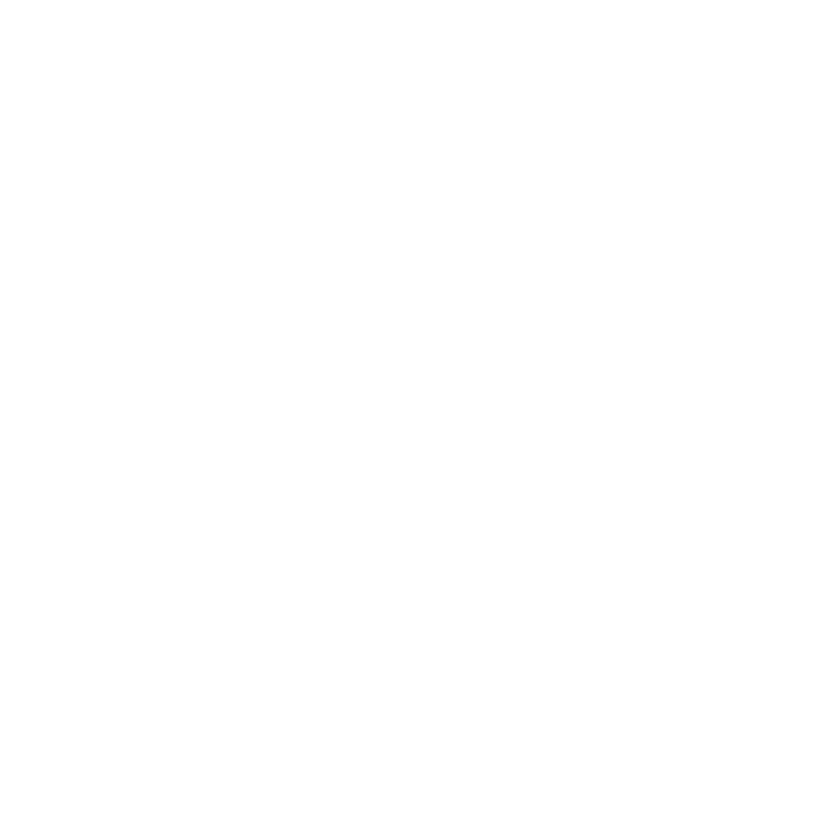

In [48]:
DoHeatmap(obj, features = top10$gene) + NoLegend()